In [1]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pylab

import seaborn as sns

import csv

import scipy
from scipy import stats

res_seed = 1

In [2]:
#import cupy as cp
from easyesn.optimizers import GradientOptimizer
from easyesn import PredictionESN
from easyesn.optimizers import GridSearchOptimizer
from easyesn import helper as hlp
import numpy as np
from wikipedia2vec import Wikipedia2Vec

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords


vectorDim = 100

numNode = 1000

#inputDataTraining = np.load('./trainingData_averaging/inputDataTraining_4k_average.npy')
#outputDataTraining = np.load('./trainingData_averaging/outputDataTraining_4k_average.npy')
#print(len(inputDataTraining))
#print(len(outputDataTraining))

Using Numpy backend.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\PeterDell\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
def cos_sim(v1, v2):
    return np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))


In [5]:
#reservoirStatesBuffer[:,:resn]

#in_small = inputDataTraining[:10000]
#out_small = outputDataTraining[:10000]


#np.save('in_small.npy', in_small)
#np.save('out_small.npy', out_small)

in_small = np.load('in_small.npy')
out_small = np.load('out_small.npy')

print(len(in_small))
print(len(out_small))

10000
10000


In [5]:
wiki2vec = Wikipedia2Vec.load('enwiki_20180420_100d.pkl')



In [6]:
# here we read the text, run the reservoir - will do this twice for intact and scrambled

#read in the narrative

huge_list = []

#with open("my_file_Gatsby_Kane_wolfe_bond.txt", "r") as f:
#    huge_list = f.read().split()::::"iss_gatsby_long.txt"
with open("not-the-fall.txt", "r", encoding="utf8") as f:
    huge_list = f.read().split()


#print(huge_list)   

discourse_words = huge_list

# clean it up
# large capital -> small capital

discourse_words = [s.replace(s, s.lower()) for s in discourse_words]

    # remove '.' and ',' from word list
discourse_words = [s.replace('.', '') for s in discourse_words]
discourse_words = [s.replace(',', '') for s in discourse_words]

    # remove stop words from word list
stop_words = stopwords.words('english')
    #print(stop_words)
for stop_word in stop_words:
    while stop_word in discourse_words :
        discourse_words.remove(stop_word)
            
            
    # remove "'s" and "'" and "-" and "'d" and "'ll" and "'ve" and "re" from word list
discourse_words = [s.replace("'s", '') for s in discourse_words]
discourse_words = [s.replace("'", '') for s in discourse_words]
discourse_words = [s.replace("-", ' ') for s in discourse_words]
discourse_words = [s.replace("'d", '') for s in discourse_words]
discourse_words = [s.replace("'ll", '') for s in discourse_words]
discourse_words = [s.replace("'ve", '') for s in discourse_words]
discourse_words = [s.replace("'re", '') for s in discourse_words]
discourse_words = [s.replace("'m", '') for s in discourse_words]
discourse_words = [s.replace("(", '') for s in discourse_words]
discourse_words = [s.replace(")", '') for s in discourse_words]
discourse_words = [s.replace("[", '') for s in discourse_words]
discourse_words = [s.replace("]", '') for s in discourse_words]
discourse_words = [s.replace(",", '') for s in discourse_words]
discourse_words = [s.replace(";", '') for s in discourse_words]
discourse_words = [s.replace("-", '') for s in discourse_words]
discourse_words = [s.replace(":", '') for s in discourse_words]
discourse_words = [s.replace("?", '') for s in discourse_words]
discourse_words = [s.replace("!", '') for s in discourse_words]



#print(discourse_words)

inputDataTesting = np.empty((0,vectorDim))
print(inputDataTesting.shape)

for num in range(len(discourse_words)):
    inputDataTesting = np.append(inputDataTesting, np.array([wiki2vec.get_word_vector(discourse_words[num])]), axis=0)
    print(discourse_words[num], num, end = ' ')
print(inputDataTesting.shape)

# set the seed
np.random.seed(res_seed)

# set up the reservoir
# leakingRate=0.2 changing too fast, mutliple with 0.05; changed
esn = PredictionESN(n_input=vectorDim, n_output=vectorDim, n_reservoir=numNode, leakingRate=0.05, regressionParameters=[1e-2], solver="lsqr", feedback=False)

# train the reervoir with a new seed
esn.fit(in_small, out_small, transientTime="Auto", verbose=1)

#run the reservoir
reservoirStatesBuffer = np.empty((0,numNode))
prediction,reservoirStatesBuffer  = esn.predict(inputDataTesting)
reservoirStatesBuffer = reservoirStatesBuffer.T
print(reservoirStatesBuffer.shape)
reservoirStatesBuffer = reservoirStatesBuffer[:,101:]
print(reservoirStatesBuffer.shape)
print(prediction.shape)

# set the similarity matrix
sim_matrix1 = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
       
print(len(reservoirStatesBuffer[1]))

# calculate the cosines in the similarity matrix
for i in range(len(reservoirStatesBuffer)):
    for j in range(len(reservoirStatesBuffer)):
        sim_matrix1[i,j] = cos_sim(reservoirStatesBuffer[i],reservoirStatesBuffer[j])

reservoirStatesBuffer1 = reservoirStatesBuffer

(0, 100)
five 0 thousand 1 feet 2 albany 3 perfect 4 day 5 beautiful 6 blue 7 sky 8 cloud 9 sky 10 see 11 horizon 12 every 13 direction 14 uh 15 girl 16 pushed 17 airplane 18 screams 19 wait 20 wait 21 chute 22 gone 23 plane 24 think 25 sentence 26 ends 27 know 28 functioning 29 properly 30 great 31 jump 32 think 33 ends 34 worse 35 know 36 lot 37 skydiving 38 would 39 think 40 know 41 working 42 chute 43 lends 44 better 45 better 46 jump 47 especially 48 towards 49 end 50 happened 51 forties 52 suddenly 53 surprisingly 54 want 55 one 56 kind 57 uh 58 midlife 59 crisis 60 guys 61 runs 62 gets 63 convertible 64 besides 65 needs 66 two 67 convertibles 68 know 69 already 70 gotten 71 divorced 72 already 73 checked 74 uh 75 needed 76 something 77 went 78 like 79 cliche 80 n 81 ber 82 three 83 drive 84 upstate 85 skydiving 86 academy 87 uh 88 near 89 albany 90 meeting 91 meeting 92 annette 93 school 94 bare 95 bellied 96 khaki 97 shorted 98 know 99 tan 100 shouldered 101 senior 102 instruct

100% (9615 of 9615) |####################| Elapsed Time: 0:00:10 Time:  0:00:10


(682, 1101)
(682, 1000)
(682, 100)
1000


In [7]:
#create inputAverageTesting by averaging successive words in inputDataTesting
#inputAverageTesting = np.empty((0,vectorDim))


inputAverageTesting1 = np.empty((len(inputDataTesting),vectorDim))

print(inputAverageTesting1.shape)

for num in range(len(inputDataTesting)):
        if num == 0:
            inputAverageTesting1[num] = inputDataTesting[num]
        else:
            #inputAverageTesting[num] = ((num * inputAverageTesting[num-1]) + inputDataTesting[num]) / (num + 1)
            inputAverageTesting1[num] = ((.95*num * inputAverageTesting1[num-1]) + 1.05*inputDataTesting[num]) / (num + 1)


(682, 100)


In [8]:
# here we read the text, run the reservoir - will do this twice for intact and scrambled

#read in the narrative

huge_list = []

#with open("my_file_Gatsby_Kane_wolfe_bond.txt", "r") as f:
#    huge_list = f.read().split()::::"iss_gatsby_long.txt"
with open("not-the-fall-shift-2.txt", "r", encoding="utf8") as f:
    huge_list = f.read().split()


#print(huge_list)   

discourse_words = huge_list

# clean it up
# large capital -> small capital

discourse_words = [s.replace(s, s.lower()) for s in discourse_words]

    # remove '.' and ',' from word list
discourse_words = [s.replace('.', '') for s in discourse_words]
discourse_words = [s.replace(',', '') for s in discourse_words]

    # remove stop words from word list
stop_words = stopwords.words('english')
    #print(stop_words)
for stop_word in stop_words:
    while stop_word in discourse_words :
        discourse_words.remove(stop_word)
            
            
    # remove "'s" and "'" and "-" and "'d" and "'ll" and "'ve" and "re" from word list
discourse_words = [s.replace("'s", '') for s in discourse_words]
discourse_words = [s.replace("'", '') for s in discourse_words]
discourse_words = [s.replace("-", ' ') for s in discourse_words]
discourse_words = [s.replace("'d", '') for s in discourse_words]
discourse_words = [s.replace("'ll", '') for s in discourse_words]
discourse_words = [s.replace("'ve", '') for s in discourse_words]
discourse_words = [s.replace("'re", '') for s in discourse_words]
discourse_words = [s.replace("'m", '') for s in discourse_words]
discourse_words = [s.replace("(", '') for s in discourse_words]
discourse_words = [s.replace(")", '') for s in discourse_words]
discourse_words = [s.replace("[", '') for s in discourse_words]
discourse_words = [s.replace("]", '') for s in discourse_words]
discourse_words = [s.replace(",", '') for s in discourse_words]
discourse_words = [s.replace(";", '') for s in discourse_words]
discourse_words = [s.replace("-", '') for s in discourse_words]
discourse_words = [s.replace(":", '') for s in discourse_words]
discourse_words = [s.replace("?", '') for s in discourse_words]
discourse_words = [s.replace("!", '') for s in discourse_words]



#print(discourse_words)

inputDataTesting = np.empty((0,vectorDim))
print(inputDataTesting.shape)

for num in range(len(discourse_words)):
    inputDataTesting = np.append(inputDataTesting, np.array([wiki2vec.get_word_vector(discourse_words[num])]), axis=0)
    print(discourse_words[num], num, end = ' ')
print(inputDataTesting.shape)

# set the seed
np.random.seed(res_seed)

# set up the reservoir
# leakingRate=0.2 changing too fast, mutliple with 0.05; changed
esn = PredictionESN(n_input=vectorDim, n_output=vectorDim, n_reservoir=numNode, leakingRate=0.05, regressionParameters=[1e-2], solver="lsqr", feedback=False)

# train the reervoir with a new seed
esn.fit(in_small, out_small, transientTime="Auto", verbose=1)

#run the reservoir
reservoirStatesBuffer = np.empty((0,numNode))
prediction,reservoirStatesBuffer  = esn.predict(inputDataTesting)
reservoirStatesBuffer = reservoirStatesBuffer.T
print(reservoirStatesBuffer.shape)
reservoirStatesBuffer = reservoirStatesBuffer[:,101:]
print(reservoirStatesBuffer.shape)
print(prediction.shape)

# set the similarity matrix
sim_matrix2 = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
       
print(len(reservoirStatesBuffer[1]))

# calculate the cosines in the similarity matrix
for i in range(len(reservoirStatesBuffer)):
    for j in range(len(reservoirStatesBuffer)):
        sim_matrix2[i,j] = cos_sim(reservoirStatesBuffer[i],reservoirStatesBuffer[j])

reservoirStatesBuffer2 = reservoirStatesBuffer

(0, 100)
five 0 thousand 1 feet 2 albany 3 perfect 4 day 5 beautiful 6 blue 7 sky 8 cloud 9 sky 10 see 11 horizon 12 every 13 direction 14 uh 15 girl 16 pushed 17 airplane 18 screams 19 wait 20 wait 21 chute 22 gone 23 plane 24 think 25 sentence 26 ends 27 know 28 functioning 29 properly 30 great 31 jump 32 think 33 ends 34 worse 35 know 36 lot 37 skydiving 38 would 39 think 40 know 41 working 42 chute 43 lends 44 better 45 better 46 jump 47 especially 48 towards 49 end 50 happened 51 forties 52 suddenly 53 surprisingly 54 want 55 one 56 kind 57 uh 58 midlife 59 crisis 60 guys 61 runs 62 gets 63 convertible 64 besides 65 needs 66 two 67 convertibles 68 know 69 already 70 gotten 71 divorced 72 already 73 checked 74 uh 75 needed 76 something 77 went 78 like 79 cliche 80 n 81 ber 82 three 83 drive 84 upstate 85 skydiving 86 academy 87 uh 88 near 89 albany 90 meeting 91 meeting 92 annette 93 school 94 bare 95 bellied 96 khaki 97 shorted 98 know 99 tan 100 shouldered 101 senior 102 instruct

100% (9615 of 9615) |####################| Elapsed Time: 0:00:09 Time:  0:00:09


(682, 1101)
(682, 1000)
(682, 100)
1000


In [9]:
#create inputAverageTesting by averaging successive words in inputDataTesting
#inputAverageTesting = np.empty((0,vectorDim))


inputAverageTesting2 = np.empty((len(inputDataTesting),vectorDim))

print(inputAverageTesting2.shape)

for num in range(len(inputDataTesting)):
        if num == 0:
            inputAverageTesting2[num] = inputDataTesting[num]
        else:
            #inputAverageTesting[num] = ((num * inputAverageTesting[num-1]) + inputDataTesting[num]) / (num + 1)
            inputAverageTesting2[num] = ((.95*num * inputAverageTesting2[num-1]) + 1.05*inputDataTesting[num]) / (num + 1)


(682, 100)


In [10]:
sim_matrix3 = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])

# is is where we see the context shift
for i in range(len(reservoirStatesBuffer)):
    for j in range(len(reservoirStatesBuffer)):
        sim_matrix3[i,j] = cos_sim(reservoirStatesBuffer1[i],reservoirStatesBuffer2[j])
        
average_matrix1 = np.empty([len(inputDataTesting),len(inputDataTesting)])
average_matrix2 = np.empty([len(inputDataTesting),len(inputDataTesting)])
average_matrix3 = np.empty([len(inputDataTesting),len(inputDataTesting)])

for i in range(len(inputDataTesting)):
    for j in range(len(inputDataTesting)):
        average_matrix1[i,j] = 0
        average_matrix2[i,j] = 0
        average_matrix3[i,j] = 0
        
for i in range(len(inputDataTesting)):
    for j in range(len(inputDataTesting)):
        average_matrix1[i,j] = cos_sim(inputAverageTesting1[i],inputAverageTesting1[j])
        average_matrix2[i,j] = cos_sim(inputAverageTesting2[i],inputAverageTesting2[j])
        average_matrix3[i,j] = cos_sim(inputAverageTesting1[i],inputAverageTesting2[j])



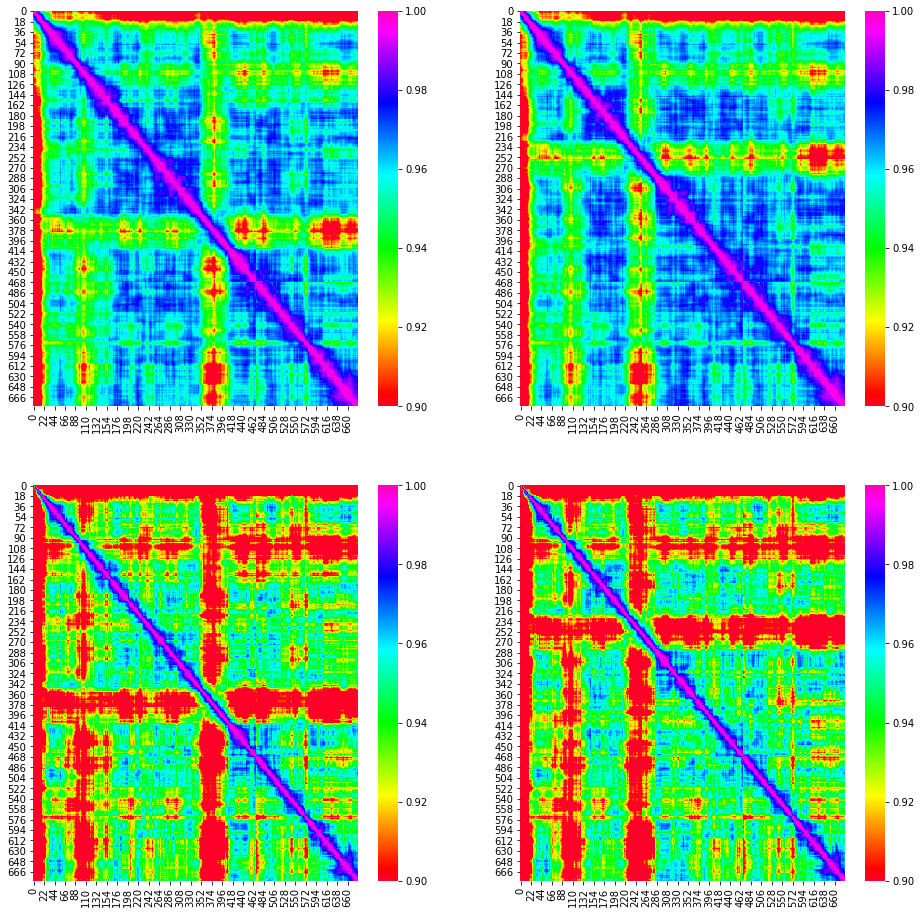

In [11]:

scale = 0.9

fig= plt.figure(figsize=(16,16))
plt.subplot(221)
sns.heatmap(sim_matrix1,  cmap='gist_rainbow', vmin=scale, vmax=1)

plt.subplot(222)
sns.heatmap(sim_matrix2,  cmap='gist_rainbow', vmin=scale, vmax=1)

plt.subplot(223)
sns.heatmap(average_matrix1,  cmap='gist_rainbow', vmin=scale, vmax=1)

plt.subplot(224)
sns.heatmap(average_matrix2,  cmap='gist_rainbow', vmin=scale, vmax=1)





plt.savefig('reservoir-not-the-fall-context-average3.png', dpi=600)

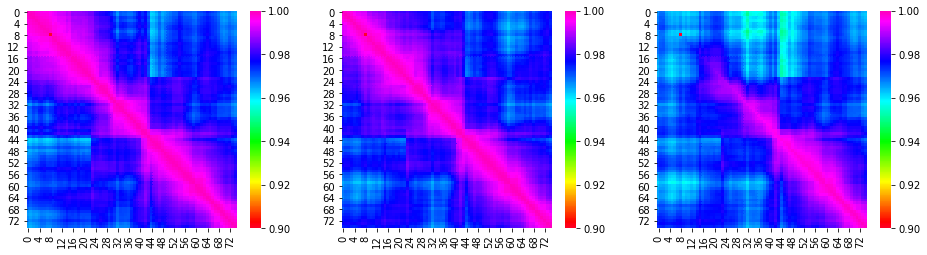

In [12]:
start = 425
end = 500
sim_matrix1[433,433] = 0
sim_matrix2[433,433] = 0
sim_matrix3[433,433] = 0

scale = 0.9

fig= plt.figure(figsize=(16,4))
plt.subplot(131)
sns.heatmap(sim_matrix1[start:end,start:end],  cmap='gist_rainbow', vmin=scale, vmax=1)

plt.subplot(132)
sns.heatmap(sim_matrix2[start:end,start:end],  cmap='gist_rainbow', vmin=scale, vmax=1)

plt.subplot(133)
sns.heatmap(sim_matrix3[start:end,start:end],  cmap='gist_rainbow', vmin=scale, vmax=1)




plt.savefig('reservoir-not-the-fall-context3.png', dpi=600)

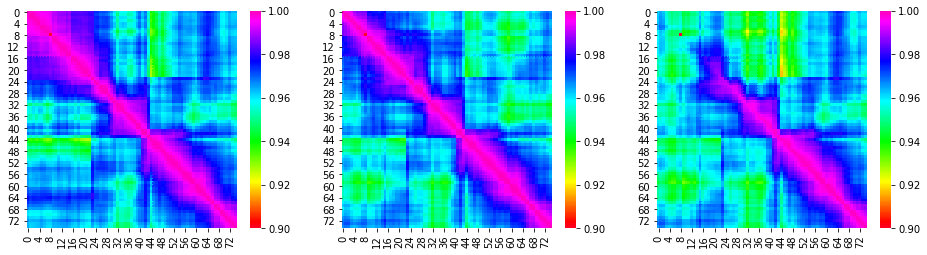

In [13]:
start = 425
end = 500
average_matrix1[433,433] = 0
average_matrix2[433,433] = 0
average_matrix3[433,433] = 0

scale = 0.9

fig= plt.figure(figsize=(16,4))
plt.subplot(131)
sns.heatmap(average_matrix1[start:end,start:end],  cmap='gist_rainbow', vmin=scale, vmax=1)

plt.subplot(132)
sns.heatmap(average_matrix2[start:end,start:end],  cmap='gist_rainbow', vmin=scale, vmax=1)

plt.subplot(133)
sns.heatmap(average_matrix3[start:end,start:end],  cmap='gist_rainbow', vmin=scale, vmax=1)




plt.savefig('reservoir-not-the-fall-context-average3.png', dpi=600)

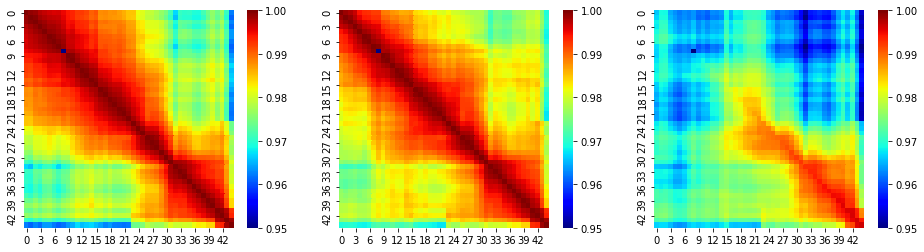

In [14]:
start = 425
end = 470
sim_matrix1[433,433] = 0
sim_matrix2[433,433] = 0
sim_matrix3[433,433] = 0
scale=0.95

fig= plt.figure(figsize=(16,4))
plt.subplot(131)
sns.heatmap(sim_matrix1[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(132)
sns.heatmap(sim_matrix2[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(133)
sns.heatmap(sim_matrix3[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)




plt.savefig('reservoir-not-the-fall-context-jet3.png', dpi=600)

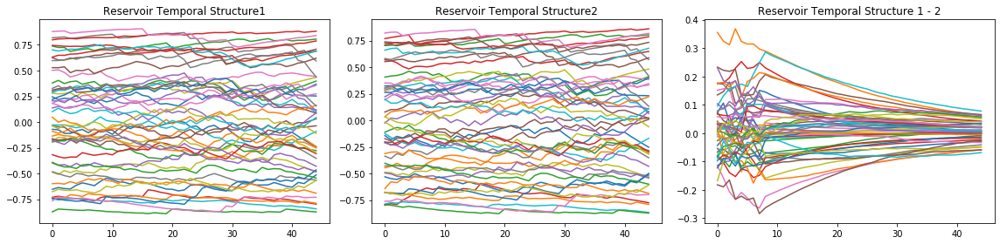

In [15]:
resn = 50
begin=425
end=470
fig= plt.figure(figsize=(16,4))
#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')

plt.subplot(131)

plt.plot( reservoirStatesBuffer1[begin:end,:resn])
plt.title('Reservoir Temporal Structure1')



plt.subplot(132)
plt.plot( reservoirStatesBuffer2[begin:end,:resn])
plt.title('Reservoir Temporal Structure2')



plt.subplot(133)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('Reservoir Temporal Structure 1 - 2')


fig.tight_layout()

plt.savefig('reservoirstates--not-the-fall-overall-differences1.png')

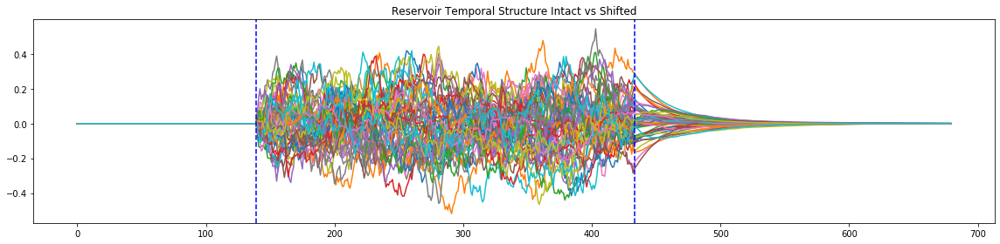

In [16]:
resn = 50
begin=0
end=680
fig= plt.figure(figsize=(16,4))

plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('Reservoir Temporal Structure Intact vs Shifted')
plt.axvline(x=139, color='b', linestyle='--')
plt.axvline(x=433, color='b', linestyle='--')


fig.tight_layout()

plt.savefig('reservoirstates--not-the-fall-differences1.png')

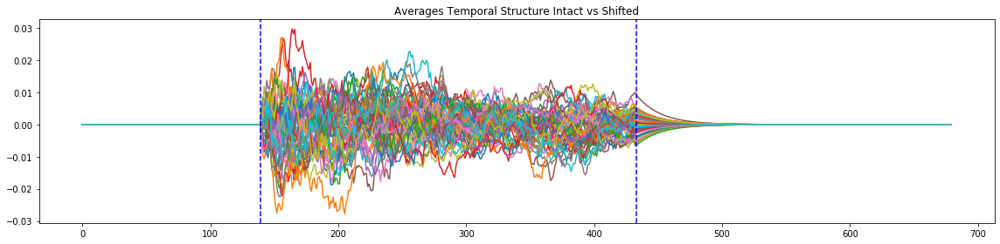

In [17]:
resn = 50
begin=0
end=680
fig= plt.figure(figsize=(16,4))

plt.plot( inputAverageTesting1[begin:end,:resn] - inputAverageTesting2[begin:end,:resn])
plt.title('Averages Temporal Structure Intact vs Shifted')
plt.axvline(x=139, color='b', linestyle='--')
plt.axvline(x=433, color='b', linestyle='--')


fig.tight_layout()

plt.savefig('reservoirstates--not-the-fall-averages-differences1.png')

In [18]:
#inputAverageTesting1[i],inputAverageTesting2[j

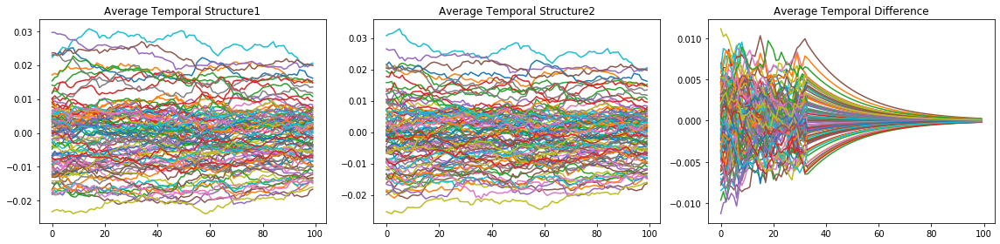

In [19]:
resn = 500
begin=400
end=500
fig= plt.figure(figsize=(16,4))
#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')

plt.subplot(131)

plt.plot( inputAverageTesting1[begin:end,:resn])
plt.title('Average Temporal Structure1')



plt.subplot(132)
plt.plot( inputAverageTesting2[begin:end,:resn])
plt.title('Average Temporal Structure2')



plt.subplot(133)
plt.plot( inputAverageTesting1[begin:end,:resn] - inputAverageTesting2[begin:end,:resn])
plt.title('Average Temporal Difference')


fig.tight_layout()

plt.savefig('reservoirstates--not-the-fall-average3.png')

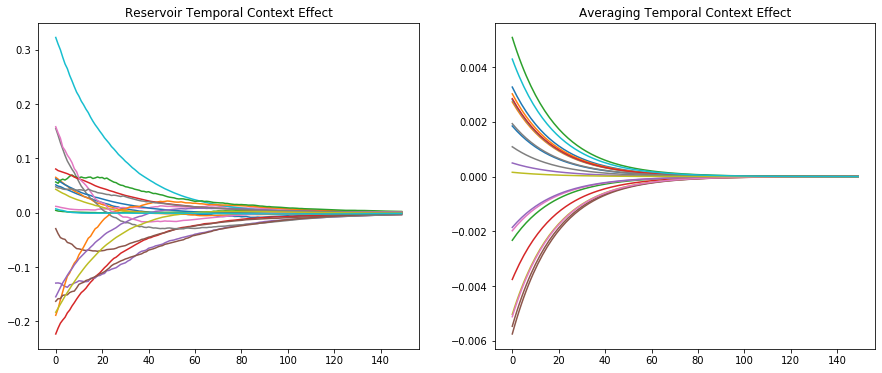

In [20]:
resn = 20
index = 50
begin=433
end=583
fig= plt.figure(figsize=(15,6))

plt.subplot(121)
plt.plot(reservoirStatesBuffer1[begin:end,index:index+resn] - reservoirStatesBuffer2[begin:end,index:index+resn])
plt.title('Reservoir Temporal Context Effect')

plt.subplot(122)
plt.plot( inputAverageTesting1[begin:end,:resn] - inputAverageTesting2[begin:end,:resn])
plt.title('Averaging Temporal Context Effect')

plt.savefig('reservoir-vs-average-convergence-not-the-fall3.png', dpi=600)

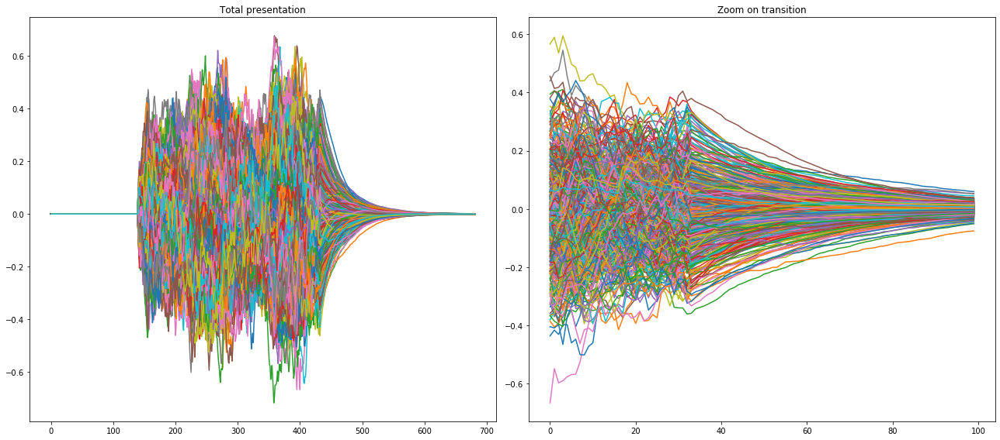

In [21]:
resn = 500
begin=400
end=500
fig= plt.figure(figsize=(18,8))
#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')

plt.subplot(121)

plt.plot( reservoirStatesBuffer1 - reservoirStatesBuffer2)
plt.title('Total presentation')


plt.subplot(122)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('Zoom on transition')


fig.tight_layout()

plt.savefig('reservoirstates-not-the-fall-temporal-context3.png')

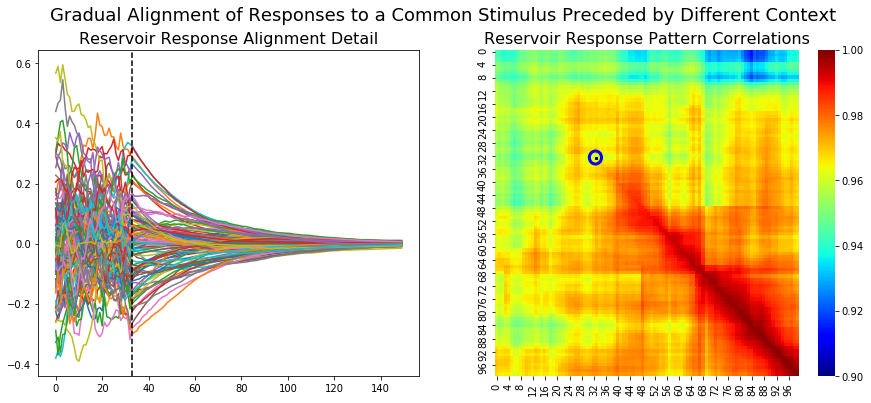

In [22]:
resn = 100
begin=400
end=550
fig= plt.figure(figsize=(15,6))

#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')


plt.subplot(121)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('Reservoir Response Alignment Detail', fontsize=16)
plt.axvline(x=33,color='k', linestyle='--')
#sim_matrix3[433,433] = 1

plt.subplot(122)
ax = fig.gca()
circle2 = plt.Circle((33, 33), 2, color='b', fill=False, lw=3)
ax.add_patch(circle2)

begin=400
end=500
sns.heatmap(sim_matrix3[begin:end,begin:end],  cmap='jet', vmin=0.9, vmax=1)
plt.title('Reservoir Response Pattern Correlations', fontsize=16)


fig.suptitle('Gradual Alignment of Responses to a Common Stimulus Preceded by Different Context', fontsize=18)

#fig.tight_layout()

plt.savefig('reservoirstates-not-the-fall-temporal-context-alignment3.png',dpi=600)

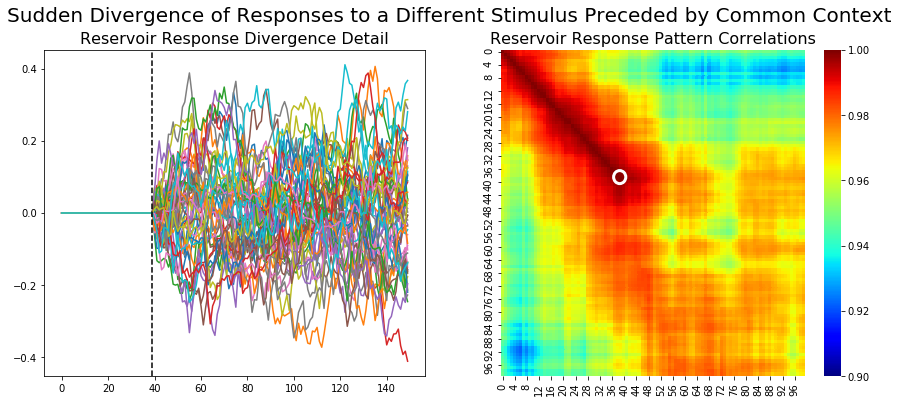

In [23]:
resn = 50
begin=100
end=250
fig= plt.figure(figsize=(15,6))
#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')


plt.subplot(121)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('Reservoir Response Divergence Detail', fontsize=16)
plt.axvline(x=39,color='k', linestyle='--')
#sim_matrix3[139,139] = 0.94
begin=100
end=200
plt.subplot(122)
ax = fig.gca()
circle2 = plt.Circle((39, 39), 2, color='w', fill=False,  lw=3)
ax.add_patch(circle2)

sns.heatmap(sim_matrix3[begin:end,begin:end],  cmap='jet', vmin=0.9, vmax=1)
plt.title('Reservoir Response Pattern Correlations', fontsize=16)

fig.suptitle('Sudden Divergence of Responses to a Different Stimulus Preceded by Common Context', fontsize=20)

#fig.tight_layout()

plt.savefig('reservoirstates-not-the-fall-temporal-context-divergence3.png',dpi=600)

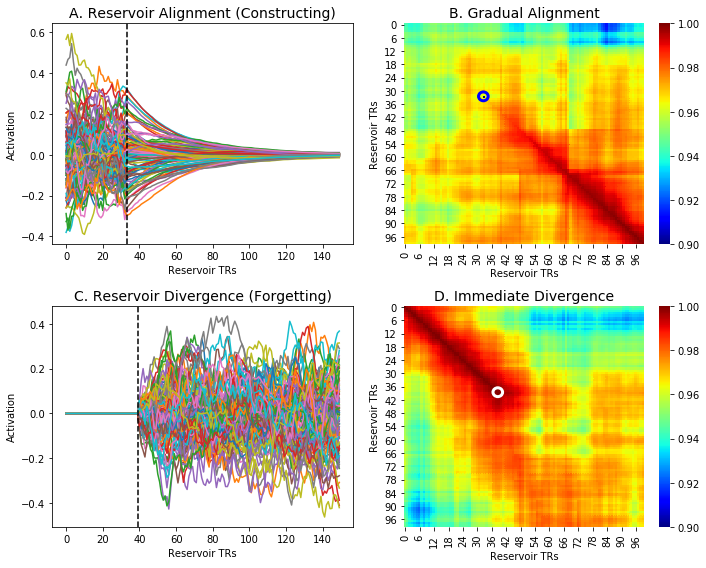

In [24]:
resn = 100
begin=400
end=550
fs=14
fs2=10
fig= plt.figure(figsize=(10,8))
#fig.suptitle('Gradual Alignment vs. Sudden Divergence', fontsize=18)

#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')


plt.subplot(221)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('A. Reservoir Alignment (Constructing)', fontsize=fs)
plt.axvline(x=33,color='k', linestyle='--')
#sim_matrix3[433,433] = 1

plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Activation', fontsize=fs2)

plt.subplot(222)
ax = fig.gca()
circle2 = plt.Circle((33, 33), 2, color='b', fill=False, lw=3)
ax.add_patch(circle2)



begin=400
end=500
sns.heatmap(sim_matrix3[begin:end,begin:end],  cmap='jet', vmin=0.9, vmax=1)
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Reservoir TRs', fontsize=fs2)
plt.title('B. Gradual Alignment', fontsize=fs)


#####################################################

resn = 100
begin=100
end=250

#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')


plt.subplot(223)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Activation', fontsize=fs2)
plt.title('C. Reservoir Divergence (Forgetting)', fontsize=fs)
plt.axvline(x=39,color='k', linestyle='--')
#sim_matrix3[139,139] = 0.94
begin=100
end=200

plt.subplot(224)
ax = fig.gca()
circle2 = plt.Circle((39, 39), 2, color='w', fill=False,  lw=3)
ax.add_patch(circle2)



sns.heatmap(sim_matrix3[begin:end,begin:end],  cmap='jet', vmin=0.9, vmax=1)
plt.title('D. Immediate Divergence', fontsize=fs)
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Reservoir TRs', fontsize=fs2)
#fig.suptitle('Sudden Divergence of Responses to a Different Stimulus Preceded by Common Context', fontsize=20)

fig.tight_layout()

plt.savefig('Convergence-DivergenceExp3.png',dpi=600)

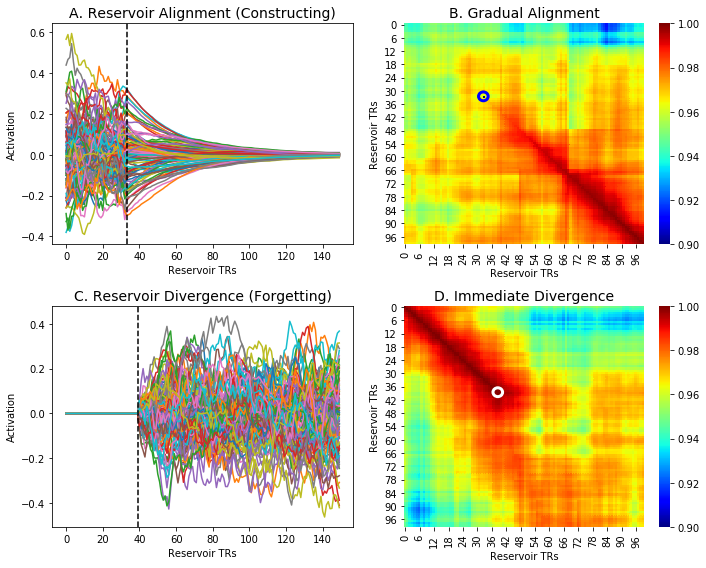

In [25]:
resn = 100
begin=400
end=550
fs=14
fs2=10
fig= plt.figure(figsize=(10,8))
#fig.suptitle('Gradual Alignment vs. Sudden Divergence', fontsize=18)

#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')


plt.subplot(221)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('A. Reservoir Alignment (Constructing)', fontsize=fs)
plt.axvline(x=33,color='k', linestyle='--')
#sim_matrix3[433,433] = 1

plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Activation', fontsize=fs2)

plt.subplot(222)
ax = fig.gca()
circle2 = plt.Circle((33, 33), 2, color='b', fill=False, lw=3)
ax.add_patch(circle2)



begin=400
end=500
sns.heatmap(sim_matrix3[begin:end,begin:end],  cmap='jet', vmin=0.9, vmax=1)
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Reservoir TRs', fontsize=fs2)
plt.title('B. Gradual Alignment', fontsize=fs)


#####################################################

resn = 100
begin=100
end=250

#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')


plt.subplot(223)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Activation', fontsize=fs2)
plt.title('C. Reservoir Divergence (Forgetting)', fontsize=fs)
plt.axvline(x=39,color='k', linestyle='--')
#sim_matrix3[139,139] = 0.94
begin=100
end=200

plt.subplot(224)
ax = fig.gca()
circle2 = plt.Circle((39, 39), 2, color='w', fill=False,  lw=3)
ax.add_patch(circle2)



sns.heatmap(sim_matrix3[begin:end,begin:end],  cmap='jet', vmin=0.9, vmax=1)
plt.title('D. Immediate Divergence', fontsize=fs)
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Reservoir TRs', fontsize=fs2)
#fig.suptitle('Sudden Divergence of Responses to a Different Stimulus Preceded by Common Context', fontsize=20)

fig.tight_layout()

plt.savefig('Convergence-DivergenceExp3.png',dpi=600)

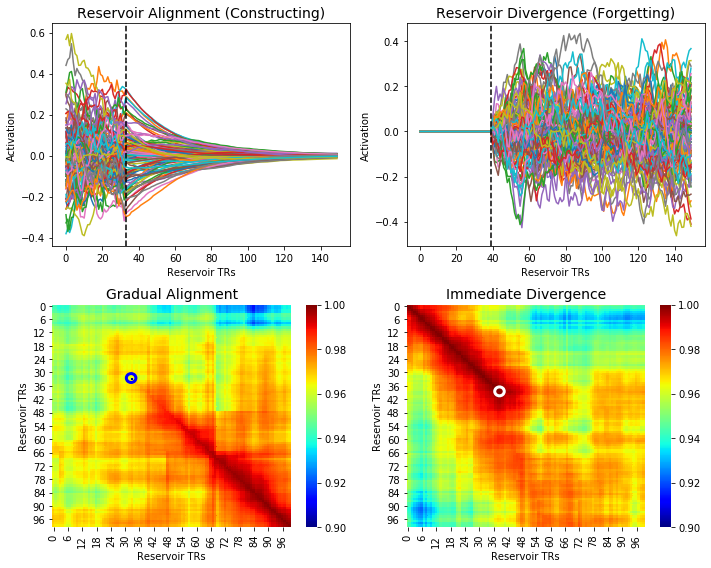

In [26]:
resn = 100
begin=400
end=550
fs=14
fs2=10
fig= plt.figure(figsize=(10,8))
#fig.suptitle('Gradual Alignment vs. Sudden Divergence', fontsize=18)

#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')


plt.subplot(221)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('Reservoir Alignment (Constructing)', fontsize=fs)
plt.axvline(x=33,color='k', linestyle='--')
#sim_matrix3[433,433] = 1

plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Activation', fontsize=fs2)

plt.subplot(223)
ax = fig.gca()
circle2 = plt.Circle((33, 33), 2, color='b', fill=False, lw=3)
ax.add_patch(circle2)



begin=400
end=500
sns.heatmap(sim_matrix3[begin:end,begin:end],  cmap='jet', vmin=0.9, vmax=1)
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Reservoir TRs', fontsize=fs2)
plt.title('Gradual Alignment', fontsize=fs)


#####################################################

resn = 100
begin=100
end=250

#fig.suptitle('State Trajectories', fontsize=16)
#fig.suptitle('State Trajectories')


plt.subplot(222)
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Activation', fontsize=fs2)
plt.title('Reservoir Divergence (Forgetting)', fontsize=fs)
plt.axvline(x=39,color='k', linestyle='--')
#sim_matrix3[139,139] = 0.94
begin=100
end=200

plt.subplot(224)
ax = fig.gca()
circle2 = plt.Circle((39, 39), 2, color='w', fill=False,  lw=3)
ax.add_patch(circle2)



sns.heatmap(sim_matrix3[begin:end,begin:end],  cmap='jet', vmin=0.9, vmax=1)
plt.title('Immediate Divergence', fontsize=fs)
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Reservoir TRs', fontsize=fs2)
#fig.suptitle('Sudden Divergence of Responses to a Different Stimulus Preceded by Common Context', fontsize=20)

fig.tight_layout()

plt.savefig('Convergence-DivergenceExp3v2.png',dpi=600)

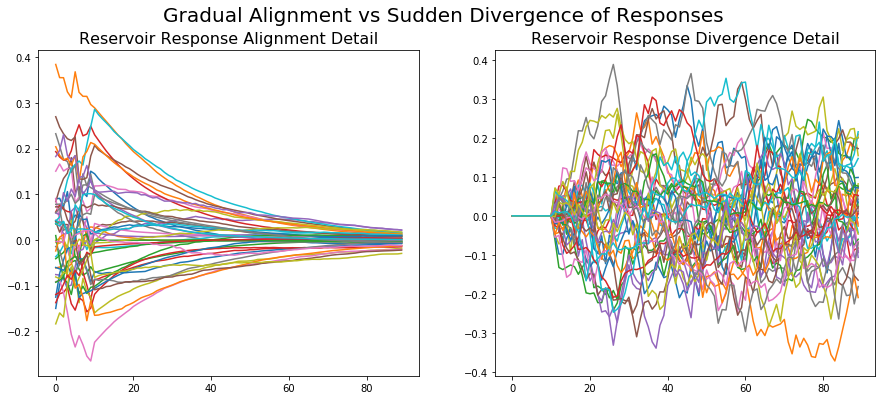

In [27]:
#inflection points at 139 433 - dispmay 10 before and 40 after
resn = 40

fig= plt.figure(figsize=(15,6))

plt.subplot(121)
begin=423
end=513
plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('Reservoir Response Alignment Detail', fontsize=16)



plt.subplot(122)
begin=129
end=219

plt.plot( reservoirStatesBuffer1[begin:end,:resn] - reservoirStatesBuffer2[begin:end,:resn])
plt.title('Reservoir Response Divergence Detail', fontsize=16)



fig.suptitle('Gradual Alignment vs Sudden Divergence of Responses', fontsize=20)

#fig.tight_layout()

plt.savefig('reservoirstates-not-the-fall-temporal-context-combned3.png',dpi=600)

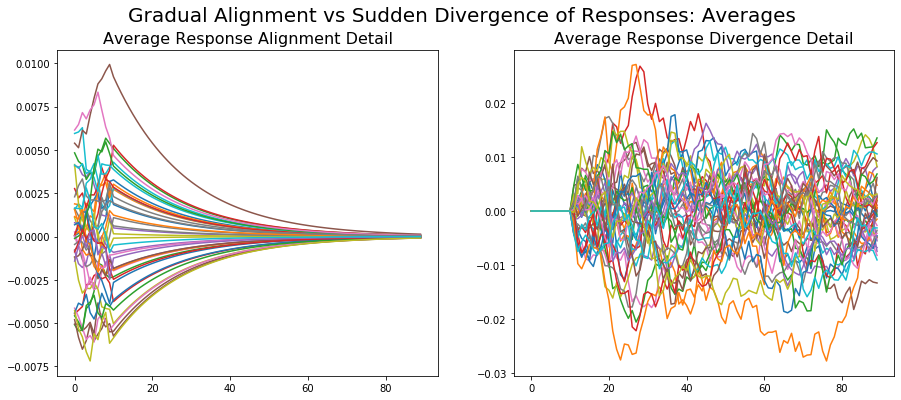

In [28]:
#inflection points at 139 433 - dispmay 10 before and 40 after
resn = 40
begin=129
end=29

fig= plt.figure(figsize=(15,6))

plt.subplot(121)
begin=423
end=513
plt.plot( inputAverageTesting1[begin:end,:resn] - inputAverageTesting2[begin:end,:resn])
plt.title('Average Response Alignment Detail', fontsize=16)



plt.subplot(122)
begin=129
end=219

plt.plot( inputAverageTesting1[begin:end,:resn] - inputAverageTesting2[begin:end,:resn])
plt.title('Average Response Divergence Detail', fontsize=16)



fig.suptitle('Gradual Alignment vs Sudden Divergence of Responses: Averages', fontsize=20)

#fig.tight_layout()

plt.savefig('reservoirstates-not-the-fall-temporal-context-combned-averages3.png',dpi=600)

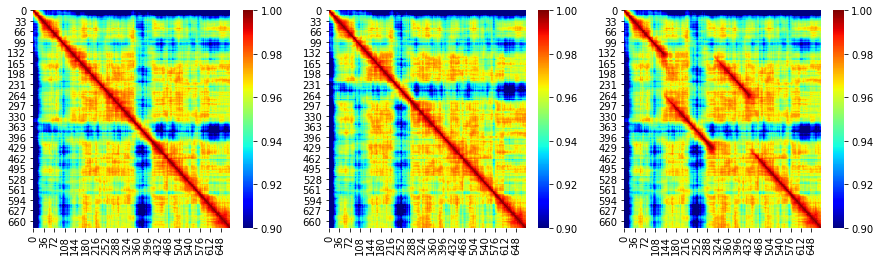

In [29]:
fig= plt.figure(figsize=(15,4))
plt.subplot(131)
min = 0.9
sns.heatmap(sim_matrix1,  
            cmap='jet', vmin = min, vmax = 1)
plt.subplot(132)
sns.heatmap(sim_matrix2,  
            cmap='jet', vmin = min, vmax = 1)
plt.subplot(133)
sns.heatmap(sim_matrix3,  
            cmap='jet', vmin = min, vmax = 1)
#plt.savefig('not-the-fall-shift-cross-comparison3.png', dpi=600)

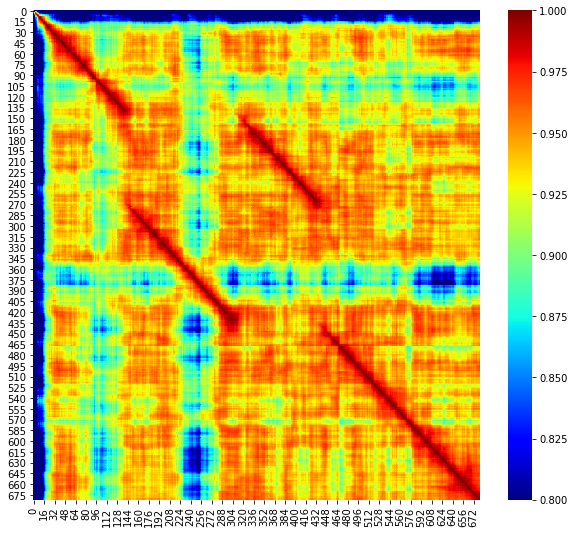

In [30]:
#now do the same thing for average vs reservor, to see if there is the same temporal behavior
fig= plt.figure(figsize=(10,9))
sns.heatmap(average_matrix3,  
            cmap='jet', vmin = 0.8, vmax = 1)
plt.savefig('not-the-fall-shift-cross-comparison-averages3.png', dpi=600)

In [31]:
print(reservoirStatesBuffer1.shape)
print(inputAverageTesting1.shape)

(682, 1000)
(682, 100)


In [32]:
# VERIFY THAT THE AVERAGE METHOD TIMECONSTANT REMAINS THE SAME 13

resn = numNode
index = 0
begin=433
end=683
data = reservoirStatesBuffer1[begin:end,index:index+resn] - reservoirStatesBuffer2[begin:end,index:index+resn]
data_avg = inputAverageTesting1[begin:end,:resn] - inputAverageTesting2[begin:end,:resn]
print(data.shape)
dataT=data.T
data_avgT=data_avg.T
print(dataT.shape)
print(dataT.shape[0])
print(dataT.shape[1])

(249, 1000)
(1000, 249)
1000
249


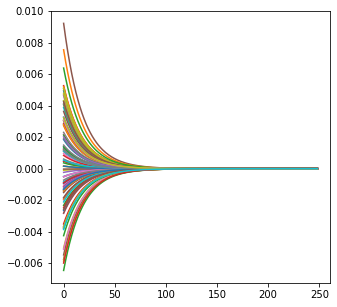

In [33]:
fig= plt.figure(figsize=(5,5))
plt.subplot(111)
plt.plot(data_avg)



In [34]:
print(dataT.shape)
print(data_avgT.shape)

(1000, 249)
(100, 249)


In [35]:
timeconstants = np.zeros(dataT.shape[0])
res_maxes = np.zeros(dataT.shape[0])

#calculate the alignment time:  dataT(neurons,time)
#interate over reservoir neuron
for neuron in range(dataT.shape[0]):
    # get the value
    max = abs(dataT[neuron,0])
    if max > -1:  #WAS 0.05
        for timestep in range(dataT.shape[1]):
            if abs(dataT[neuron,timestep]) < max/2:
                timeconstants[neuron] = timestep
                res_maxes[neuron] = max
                max=-1     
print(timeconstants)
print(len(timeconstants))
print(res_maxes)

[ 10.  17.  17.  19.   1.  44.  35.   8.  19.  14.  33.   4.  20.  14.
  12.  22.  11.  14. 137.  19.  59.  18.  10.   9.  11.  30.  17.  36.
   6.  86.  14.  26.  11.  12.  45.  41.   1.  19.  61.  11.   3.  16.
  98.  19.   8.  14.  30.   2.  57. 139.  16.  12.   4.  19.  41.  78.
   9.   8.  12.  18.  16.   8.  50.  24.  12.  33.   9.  35.  15.   4.
  10.   9.  12.  17.  17.  13.  11.  13.  20.  82.  12.   8.  17.  11.
 111.  13.  21.  24.   8.  15.  34.  23.  21.  30.  31.  41.  49.  26.
  11.  56.   5.  27.  27.   9.  15.   1.  43.  11.  23.   3.  59.  12.
   9.  50.  28.  11.   6.  39.  12.  51.  21.   9.  28.  10.  13.   9.
   9.  12.   4.  26.   8.  66.  22.  15.  16.  16.  55.  54.  11.  44.
  11.  13.  68.   4.  10.  33.  24.  38.  66.   6.  12.   2.  10.  15.
  12.  15.  16.  15.  42.  80.   3.  20.  11.   5.   4.  12.   5.  23.
  56.  20.  12.  34.  11.  13.  22. 129.  19.  10.  18.  18.  12.  15.
  27.  33.   7.  15.  42.   4.  34.  19.  61.  22.  23.  18.  16.   7.
  20. 

In [36]:
#we observed that all the average elements have the same time constant.  So to find a way to order them, we fix max,
# which then allows an order to be established
timeconstants_avg = np.zeros(data_avgT.shape[0])
avg_maxes = np.zeros(data_avgT.shape[0])

#calculate the alignment time:  dataT(neurons,time)
#interate over reservoir neuron
for neuron in range(data_avgT.shape[0]):
    # get the value
    #max = abs(data_avgT[neuron,0])
    max = 0.00001
    if max > -1:  #WAS 0.05
        for timestep in range(data_avgT.shape[1]):
            if abs(data_avgT[neuron,timestep]) < max:
                timeconstants_avg[neuron] = timestep
                avg_maxes[neuron]=abs(data_avgT[neuron,0])
                max=-1     
print(timeconstants_avg)
print(len(timeconstants_avg))  
print(avg_maxes)

[ 98. 106. 103. 112.  74. 120. 100.  88. 117. 106. 109. 108. 117. 106.
  98. 119. 117.  99.  52. 114. 111.  99. 114. 118.  85.  98.  87.  78.
  43. 112. 105.  91. 113. 104.  91. 129. 116. 102. 120.  73.  93. 118.
 122.  73. 116.  95. 106. 113. 114.  83. 117. 106.  68.  89.  59.  17.
  86.  91. 117. 101.  85.  93. 108.  84.  74. 106. 111.  90. 116.  75.
  93.  53.  93. 110. 112. 111. 101.  94. 111.  92.  53.  92. 101.  85.
  90. 114.  74.  81. 112.  89.  92. 125. 122. 120. 100. 105. 108.  90.
 109. 112.]
100
[1.84949770e-03 2.73024078e-03 2.32693693e-03 3.75822837e-03
 4.98096921e-04 5.75192676e-03 1.97867907e-03 1.09019018e-03
 5.03397113e-03 2.81299482e-03 3.27198270e-03 3.02435733e-03
 5.08557393e-03 2.84843760e-03 1.85650649e-03 5.46946940e-03
 5.12131865e-03 1.93432578e-03 1.57959325e-04 4.29445790e-03
 3.66286276e-03 1.93088539e-03 4.24911268e-03 5.27192975e-03
 9.15699371e-04 1.83860765e-03 1.03968373e-03 6.15447231e-04
 9.53196679e-05 3.87627088e-03 2.65316110e-03 1.23821604e-03

In [37]:
print(timeconstants)
print(len(timeconstants))

[ 10.  17.  17.  19.   1.  44.  35.   8.  19.  14.  33.   4.  20.  14.
  12.  22.  11.  14. 137.  19.  59.  18.  10.   9.  11.  30.  17.  36.
   6.  86.  14.  26.  11.  12.  45.  41.   1.  19.  61.  11.   3.  16.
  98.  19.   8.  14.  30.   2.  57. 139.  16.  12.   4.  19.  41.  78.
   9.   8.  12.  18.  16.   8.  50.  24.  12.  33.   9.  35.  15.   4.
  10.   9.  12.  17.  17.  13.  11.  13.  20.  82.  12.   8.  17.  11.
 111.  13.  21.  24.   8.  15.  34.  23.  21.  30.  31.  41.  49.  26.
  11.  56.   5.  27.  27.   9.  15.   1.  43.  11.  23.   3.  59.  12.
   9.  50.  28.  11.   6.  39.  12.  51.  21.   9.  28.  10.  13.   9.
   9.  12.   4.  26.   8.  66.  22.  15.  16.  16.  55.  54.  11.  44.
  11.  13.  68.   4.  10.  33.  24.  38.  66.   6.  12.   2.  10.  15.
  12.  15.  16.  15.  42.  80.   3.  20.  11.   5.   4.  12.   5.  23.
  56.  20.  12.  34.  11.  13.  22. 129.  19.  10.  18.  18.  12.  15.
  27.  33.   7.  15.  42.   4.  34.  19.  61.  22.  23.  18.  16.   7.
  20. 

In [38]:
save_timeconstants = timeconstants
timeconstants = np.sort(save_timeconstants)

In [39]:
save_timeconstants_avg = timeconstants_avg
timeconstants_avg = np.sort(save_timeconstants_avg)

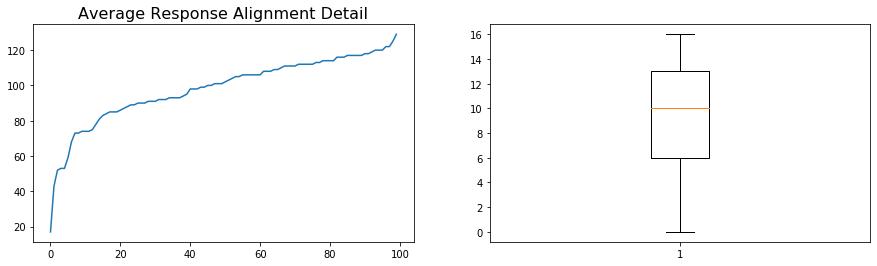

In [40]:
begin = 0
#end = 100
end = 500
fig= plt.figure(figsize=(15,4))
#488
plt.subplot(121)
plt.plot(timeconstants_avg[begin:end])
plt.title('Average Response Alignment Detail', fontsize=16)


ax = fig.add_subplot(122)
bp = ax.boxplot(timeconstants[begin:end])

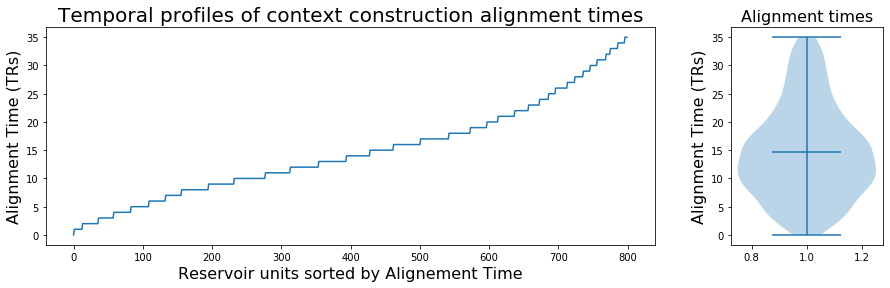

In [41]:
fig= plt.figure(figsize=(15,4))
#488
begin = 0  #166
end = 800    #468
gs = gridspec.GridSpec(1, 2,width_ratios=[4,1])
plt.subplot(gs[0])
plt.plot(timeconstants[begin:end])
fs2=16
plt.xlabel('Reservoir units sorted by Alignement Time', fontsize=fs2)
plt.ylabel('Alignment Time (TRs)', fontsize=fs2)
#plt.axhline(y=13, color='b', linestyle='--')

plt.title('Temporal profiles of context construction alignment times', fontsize=20)


ax = fig.add_subplot(gs[1])
bp = ax.violinplot(timeconstants[begin:end], showmeans=True)
#plt.hist(timeconstants[begin:end], bins = 10)

plt.title('Alignment times', fontsize=16)
#plt.axhline(y=13, color='b', linestyle='--')
f2=12

plt.ylabel('Alignment Time (TRs)', fontsize=fs2)

plt.savefig('not-the-fall-alignment-times3.png', dpi=600)

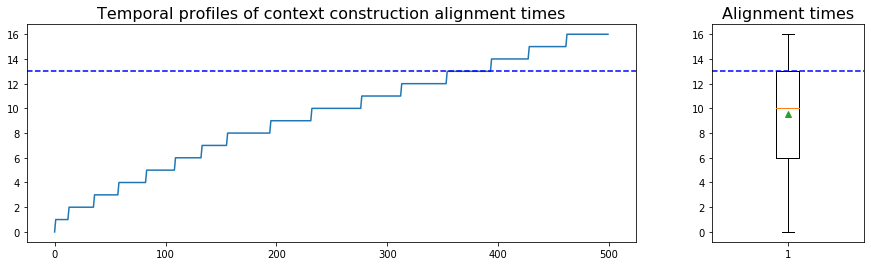

In [42]:
fig= plt.figure(figsize=(15,4))
#488
begin = 0#166
end = 500
gs = gridspec.GridSpec(1, 2,width_ratios=[4,1])
plt.subplot(gs[0])
plt.plot(timeconstants[begin:end])
plt.axhline(y=13, color='b', linestyle='--')

plt.title('Temporal profiles of context construction alignment times', fontsize=16)


ax = fig.add_subplot(gs[1])
bp = ax.boxplot(timeconstants[begin:end], showmeans=True)
plt.title('Alignment times', fontsize=16)
plt.axhline(y=13, color='b', linestyle='--')

plt.savefig('not-the-fall-05-alignment-times-extended3.png', dpi=600)

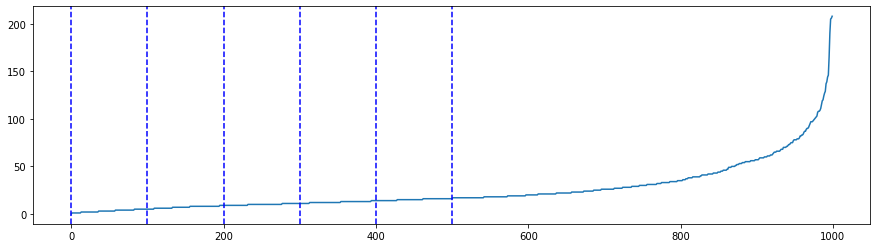

In [43]:
fig= plt.figure(figsize=(15,4))
plt.plot(timeconstants)
transfer = 166
delta = 83.5
plt.axvline(x=0, color='b', linestyle='--')
plt.axvline(x=100, color='b', linestyle='--')
plt.axvline(x=200, color='b', linestyle='--')
plt.axvline(x=300, color='b', linestyle='--')
plt.axvline(x=400, color='b', linestyle='--')
plt.axvline(x=500, color='b', linestyle='--')
#plt.yscale('log')
#plt.xscale('logit')
plt.savefig('ot-the-fall-shift-time-constants3.png', dpi=600)

In [44]:
print(reservoirStatesBuffer1.shape)
#that is (timesteps, neuron)
timesteps = reservoirStatesBuffer1.shape[0]
neurons = reservoirStatesBuffer1.shape[1]
print(timesteps)
print(neurons)
print(len(timeconstants))

(682, 1000)
682
1000
1000


In [45]:
# add a column to store the time constants into the 

reservoirStates1SortedT = np.zeros((neurons,timesteps+1))
reservoirStates1SortedT[:,:-1] = reservoirStatesBuffer1.T

In [46]:
reservoirStates1SortedT[:,682]=save_timeconstants

In [47]:
SortedStates = reservoirStates1SortedT[np.argsort(reservoirStates1SortedT[:, 682])]

In [48]:
# now we can create the pattern correlation matrices for different time-constant plages
print(SortedStates.shape)
SortedStatesT=SortedStates.T
print(SortedStatesT.shape)
print(SortedStatesT[:,400:450].shape)

(1000, 683)
(683, 1000)
(683, 50)


In [49]:
#now get the sorted reservoir for buffer2
reservoirStates2SortedT = np.zeros((neurons,timesteps+1))
reservoirStates2SortedT[:,:-1] = reservoirStatesBuffer2.T
reservoirStates2SortedT[:,682]=save_timeconstants
SortedStates2 = reservoirStates2SortedT[np.argsort(reservoirStates2SortedT[:, 682])]
# now we can create the pattern correlation matrices for different time-constant plages
print(SortedStates2.shape)
SortedStates2T=SortedStates2.T
print(SortedStates2T.shape)
print(SortedStates2T[:,400:450].shape)

(1000, 683)
(683, 1000)
(683, 50)


In [50]:
timesteps = inputAverageTesting1.shape[0]
neurons = inputAverageTesting1.shape[1]
print(timesteps)
print(neurons)

682
100


In [51]:
#now replicat this whole process for the averages and average time constants
#now get the sorted averages
#inputAverageTesting1

inputAverageTesting1SortedT = np.zeros((neurons,timesteps+1))
inputAverageTesting1SortedT[:,:-1] = inputAverageTesting1.T
inputAverageTesting1SortedT[:,682]=save_timeconstants_avg
SortedAvg1 = inputAverageTesting1SortedT[np.argsort(inputAverageTesting1SortedT[:, 682])]
# now we can create the pattern correlation matrices for different time-constant plages
print(SortedAvg1.shape)
SortedAvg1T=SortedAvg1.T
print(SortedAvg1T.shape)
print(SortedAvg1T[:,50:75].shape)

(100, 683)
(683, 100)
(683, 25)


In [52]:
#now replicat this whole process for the averages and average time constants
#now get the sorted averages
#inputAverageTesting2

inputAverageTesting2SortedT = np.zeros((neurons,timesteps+1))
inputAverageTesting2SortedT[:,:-1] = inputAverageTesting2.T
inputAverageTesting2SortedT[:,682]=save_timeconstants_avg
SortedAvg2 = inputAverageTesting2SortedT[np.argsort(inputAverageTesting2SortedT[:, 682])]
# now we can create the pattern correlation matrices for different time-constant plages
print(SortedAvg2.shape)
SortedAvg2T=SortedAvg2.T
print(SortedAvg2T.shape)
print(SortedAvg2T[:,50:75].shape)

(100, 683)
(683, 100)
(683, 25)


In [53]:
print(save_timeconstants)

[ 10.  17.  17.  19.   1.  44.  35.   8.  19.  14.  33.   4.  20.  14.
  12.  22.  11.  14. 137.  19.  59.  18.  10.   9.  11.  30.  17.  36.
   6.  86.  14.  26.  11.  12.  45.  41.   1.  19.  61.  11.   3.  16.
  98.  19.   8.  14.  30.   2.  57. 139.  16.  12.   4.  19.  41.  78.
   9.   8.  12.  18.  16.   8.  50.  24.  12.  33.   9.  35.  15.   4.
  10.   9.  12.  17.  17.  13.  11.  13.  20.  82.  12.   8.  17.  11.
 111.  13.  21.  24.   8.  15.  34.  23.  21.  30.  31.  41.  49.  26.
  11.  56.   5.  27.  27.   9.  15.   1.  43.  11.  23.   3.  59.  12.
   9.  50.  28.  11.   6.  39.  12.  51.  21.   9.  28.  10.  13.   9.
   9.  12.   4.  26.   8.  66.  22.  15.  16.  16.  55.  54.  11.  44.
  11.  13.  68.   4.  10.  33.  24.  38.  66.   6.  12.   2.  10.  15.
  12.  15.  16.  15.  42.  80.   3.  20.  11.   5.   4.  12.   5.  23.
  56.  20.  12.  34.  11.  13.  22. 129.  19.  10.  18.  18.  12.  15.
  27.  33.   7.  15.  42.   4.  34.  19.  61.  22.  23.  18.  16.   7.
  20. 

In [54]:
# now we can create the pattern correlation matrices for different time-constant plages
print(SortedStates.shape)
SortedStatesT=SortedStates.T
print(SortedStatesT.shape)
print(SortedStatesT[:,400:450].shape)

(1000, 683)
(683, 1000)
(683, 50)


In [55]:
begin = 166
end = 468
# set the 3 similarity matrix
time1_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time2_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time3_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time4_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time5_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time_control_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
       
# calculate the cosines in the similarity matrix - in five sets of 100 neurons
for i in range(len(reservoirStatesBuffer)):
    for j in range(len(reservoirStatesBuffer)):
        time1_matrix[i,j] = cos_sim(SortedStatesT[i,0:199],SortedStatesT[j,0:199])
        time2_matrix[i,j] = cos_sim(SortedStatesT[i,200:399],SortedStatesT[j,200:399])
        time3_matrix[i,j] = cos_sim(SortedStatesT[i,400:599],SortedStatesT[j,400:599])
        time4_matrix[i,j] = cos_sim(SortedStatesT[i,600:799],SortedStatesT[j,600:799])
        time5_matrix[i,j] = cos_sim(SortedStatesT[i,800:1000],SortedStatesT[j,800:1000])
        time_control_matrix[i,j] = cos_sim(SortedStatesT[i],SortedStatesT[j])

        


In [56]:
#now do the same thing for the differences between intact and scrambled

# set the 3 similarity matrix
time1_diff_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time2_diff_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time3_diff_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time4_diff_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time5_diff_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time_control_diff_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
       
# calculate the cosines in the similarity matrix - in five sets of 100 neurons
for i in range(len(reservoirStatesBuffer)):
    for j in range(len(reservoirStatesBuffer)):
        time1_diff_matrix[i,j] = cos_sim(SortedStatesT[i,0:199],SortedStates2T[j,0:199])
        time2_diff_matrix[i,j] = cos_sim(SortedStatesT[i,200:399],SortedStates2T[j,200:399])
        time3_diff_matrix[i,j] = cos_sim(SortedStatesT[i,400:599],SortedStates2T[j,400:599])
        time4_diff_matrix[i,j] = cos_sim(SortedStatesT[i,600:799],SortedStates2T[j,600:799])
        time5_diff_matrix[i,j] = cos_sim(SortedStatesT[i,800:1000],SortedStates2T[j,800:1000])
        time_control_diff_matrix[i,j] = cos_sim(SortedStatesT[i],SortedStates2T[j])

        


In [57]:
#finally, do the same for the averages, as a control

# set the 3 similarity matrix
avg1_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg2_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg3_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg4_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg5_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg_control_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
       
# calculate the cosines in the similarity matrix - in five sets of 100 neurons
for i in range(len(inputAverageTesting1)):
    for j in range(len(inputAverageTesting1)):
        avg1_matrix[i,j] = cos_sim(SortedAvg1T[i,0:19],SortedAvg1T[j,0:19])
        avg2_matrix[i,j] = cos_sim(SortedAvg1T[i,20:39],SortedAvg1T[j,20:39])
        avg3_matrix[i,j] = cos_sim(SortedAvg1T[i,40:59],SortedAvg1T[j,40:59])
        avg4_matrix[i,j] = cos_sim(SortedAvg1T[i,60:79],SortedAvg1T[j,60:79])
        avg5_matrix[i,j] = cos_sim(SortedAvg1T[i,80:100],SortedAvg1T[j,80:100])
        avg_control_matrix[i,j] = cos_sim(SortedAvg1T[i],SortedAvg1T[j])

        


In [58]:
#finally, do the same for the averages, as a control

# set the 3 similarity matrix
avg1_diff_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg2_diff_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg3_diff_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg4_diff_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg5_diff_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
avg_control_diff_matrix = np.empty([len(inputAverageTesting1),len(inputAverageTesting1)])
       
# calculate the cosines in the similarity matrix - in five sets of 100 neurons
for i in range(len(inputAverageTesting1)):
    for j in range(len(inputAverageTesting1)):
        avg1_diff_matrix[i,j] = cos_sim(SortedAvg1T[i,0:19],SortedAvg2T[j,0:19])
        avg2_diff_matrix[i,j] = cos_sim(SortedAvg1T[i,20:39],SortedAvg2T[j,20:39])
        avg3_diff_matrix[i,j] = cos_sim(SortedAvg1T[i,40:59],SortedAvg2T[j,40:59])
        avg4_diff_matrix[i,j] = cos_sim(SortedAvg1T[i,60:79],SortedAvg2T[j,60:79])
        avg5_diff_matrix[i,j] = cos_sim(SortedAvg1T[i,80:100],SortedAvg2T[j,80:100])
        avg_control_diff_matrix[i,j] = cos_sim(SortedAvg1T[i],SortedAvg2T[j])

        


In [59]:
begin = 166
end = 468
# set the 3 similarity matrix
time1bis_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time2bis_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
time3bis_matrix = np.empty([len(reservoirStatesBuffer),len(reservoirStatesBuffer)])
       
# calculate the cosines in the similarity matrix - in five sets of 100 neurons
for i in range(len(reservoirStatesBuffer)):
    for j in range(len(reservoirStatesBuffer)):
        time1bis_matrix[i,j] = cos_sim(SortedStatesT[i,100:200],SortedStatesT[j,100:200])
        time2bis_matrix[i,j] = cos_sim(SortedStatesT[i,400:500],SortedStatesT[j,400:500])
        time3bis_matrix[i,j] = cos_sim(SortedStatesT[i,700:800],SortedStatesT[j,700:800])


In [60]:
print(reservoirStatesBuffer.shape)
print(len(reservoirStatesBuffer))

(682, 1000)
682


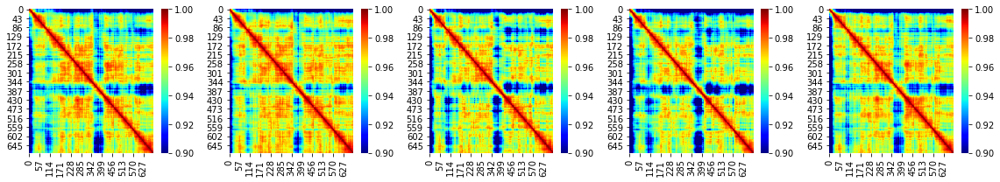

In [61]:
scale = 0.9

fig= plt.figure(figsize=(16,3))
plt.subplot(151)
sns.heatmap(time1_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(152)
sns.heatmap(time2_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(153)
sns.heatmap(time3_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(154)
sns.heatmap(time4_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(155)
sns.heatmap(time5_matrix,  cmap='jet', vmin=scale, vmax=1)



fig.tight_layout()

plt.savefig('reservoir-not-the-fall-time-tree-structure-3.png', dpi=600)

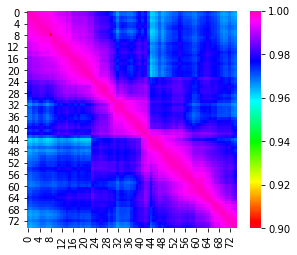

In [62]:
start = 425
end = 500
sim_matrix1[433,433] = 0
sim_matrix2[433,433] = 0
sim_matrix3[433,433] = 0

scale = 0.9

fig= plt.figure(figsize=(16,4))
plt.subplot(131)
sns.heatmap(sim_matrix1[start:end,start:end],  cmap='gist_rainbow', vmin=scale, vmax=1)

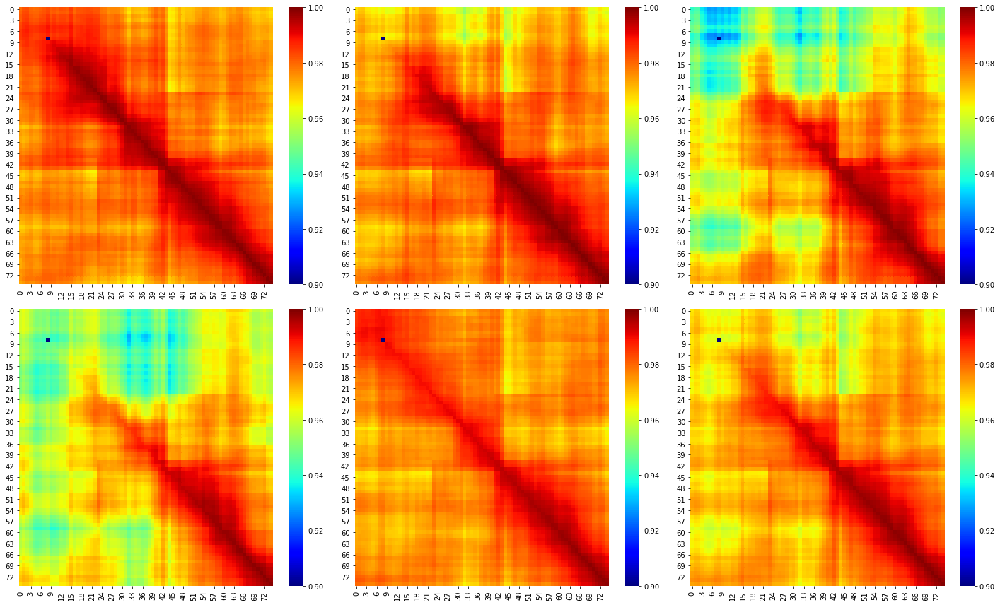

In [63]:
scale = 0.9
start = 425
end = 500

time1_diff_matrix[433,433] = 0
time2_diff_matrix[433,433] = 0
time3_diff_matrix[433,433] = 0
time4_diff_matrix[433,433] = 0
time5_diff_matrix[433,433] = 0
time_control_diff_matrix[433,433] = 0

fig= plt.figure(figsize=(20,12))
plt.subplot(231)
sns.heatmap(time1_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(232)
sns.heatmap(time2_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(233)
sns.heatmap(time3_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(234)
sns.heatmap(time4_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(235)
sns.heatmap(time5_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(236)
sns.heatmap(time_control_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

fig.tight_layout()

plt.savefig('reservoir-not-the-fall-time-tree-structure-differences_jet3-convergence.png', dpi=600)

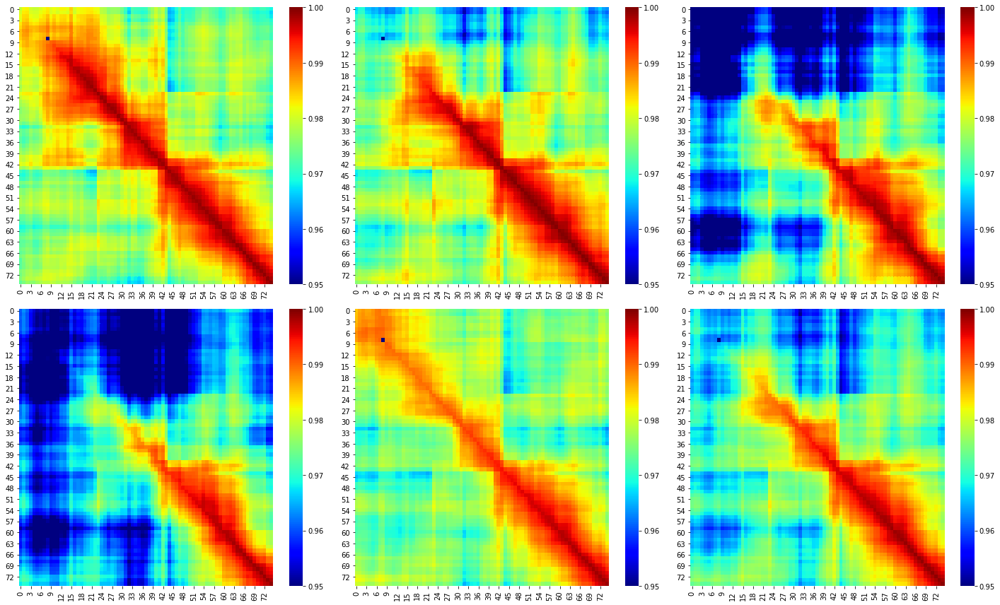

In [64]:
scale = 0.95
start = 425
end = 500

time1_diff_matrix[433,433] = 0
time2_diff_matrix[433,433] = 0
time3_diff_matrix[433,433] = 0
time4_diff_matrix[433,433] = 0
time5_diff_matrix[433,433] = 0
time_control_diff_matrix[433,433] = 0

fig= plt.figure(figsize=(20,12))
plt.subplot(231)
sns.heatmap(time1_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(232)
sns.heatmap(time2_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(233)
sns.heatmap(time3_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(234)
sns.heatmap(time4_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(235)
sns.heatmap(time5_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(236)
sns.heatmap(time_control_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

fig.tight_layout()

plt.savefig('reservoir-not-the-fall-time-tree-structure-differences_jet3-convergence.png', dpi=600)

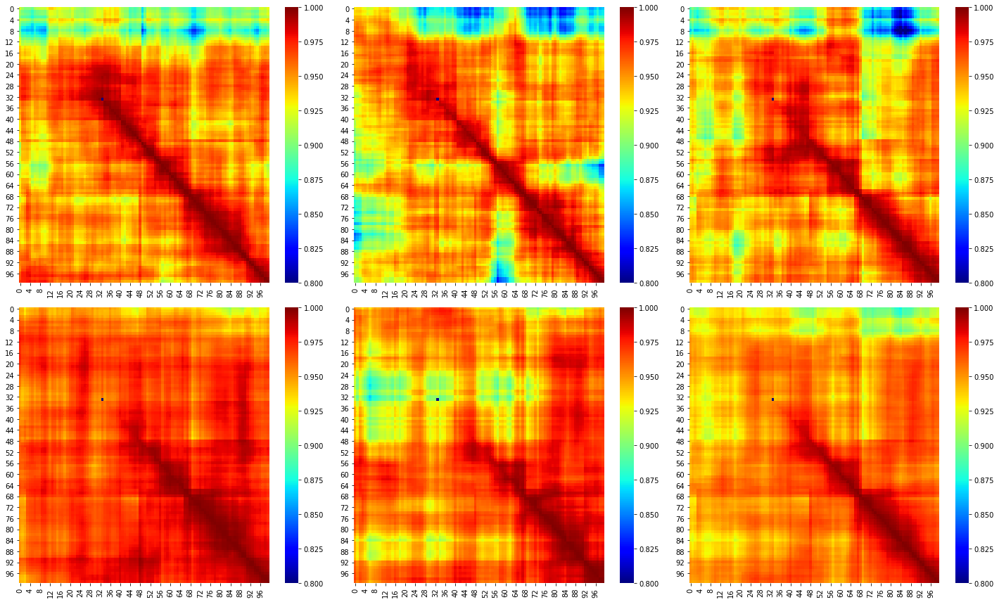

In [65]:
scale = 0.8
start = 400 #425
end = 500

avg1_diff_matrix[433,433] = 0
avg2_diff_matrix[433,433] = 0
avg3_diff_matrix[433,433] = 0
avg4_diff_matrix[433,433] = 0
avg5_diff_matrix[433,433] = 0
avg_control_diff_matrix[433,433] = 0

fig= plt.figure(figsize=(20,12))
plt.subplot(231)
sns.heatmap(avg1_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(232)
sns.heatmap(avg2_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(233)
sns.heatmap(avg3_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(234)
sns.heatmap(avg4_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(235)
sns.heatmap(avg5_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

plt.subplot(236)
sns.heatmap(avg_control_diff_matrix[start:end,start:end],  cmap='jet', vmin=scale, vmax=1)

fig.tight_layout()

plt.savefig('average-not-the-fall-avg-tree-structure-differences_jet3-divergence.png', dpi=600)

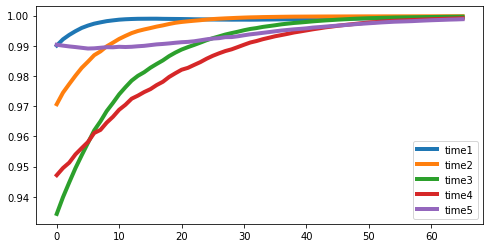

In [66]:
start = 434
end = 500
start = 434
end = 500
fig= plt.figure(figsize=(8,4))
plt.plot(time1_diff_matrix[start:end,start:end].diagonal(), label = "time1",linewidth=4.0)
plt.plot(time2_diff_matrix[start:end,start:end].diagonal(), label = "time2",linewidth=4.0)
plt.plot(time3_diff_matrix[start:end,start:end].diagonal(), label = "time3",linewidth=4.0)
plt.plot(time4_diff_matrix[start:end,start:end].diagonal(), label = "time4",linewidth=4.0)
plt.plot(time5_diff_matrix[start:end,start:end].diagonal(), label = "time5",linewidth=4.0)

plt.legend()
plt.show()

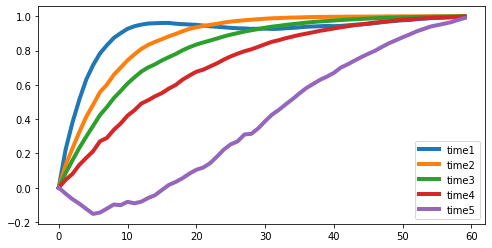

In [104]:
#calculate scaling factor

#start = 434
#end = 534

start = 434
end = 494

scale1=(time1_diff_matrix[end,end]/abs(time1_diff_matrix[start,start])-1)
scale2=(time2_diff_matrix[end,end]/abs(time2_diff_matrix[start,start])-1)
scale3=(time3_diff_matrix[end,end]/abs(time3_diff_matrix[start,start])-1)
scale4=(time4_diff_matrix[end,end]/abs(time4_diff_matrix[start,start])-1)
scale5=(time5_diff_matrix[end,end]/abs(time5_diff_matrix[start,start])-1)

fig= plt.figure(figsize=(8,4))
plt.plot((time1_diff_matrix[start:end,start:end].diagonal()/abs(time1_diff_matrix[start,start])-1)/scale1, label = "time1",linewidth=4.0)
plt.plot((time2_diff_matrix[start:end,start:end].diagonal()/abs(time2_diff_matrix[start,start])-1)/scale2, label = "time2",linewidth=4.0)
plt.plot((time3_diff_matrix[start:end,start:end].diagonal()/abs(time3_diff_matrix[start,start])-1)/scale3, label = "time3",linewidth=4.0)
plt.plot((time4_diff_matrix[start:end,start:end].diagonal()/abs(time4_diff_matrix[start,start])-1)/scale4, label = "time4",linewidth=4.0)
plt.plot((time5_diff_matrix[start:end,start:end].diagonal()/abs(time5_diff_matrix[start,start])-1)/scale5, label = "time5",linewidth=4.0)

plt.legend()
plt.show()

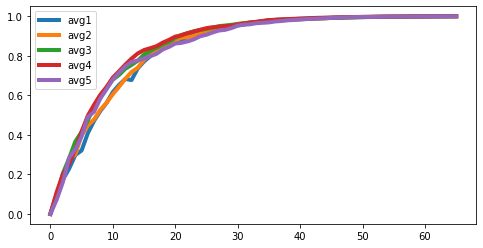

In [68]:
#calculate scaling factor

start = 434
end = 500
scale1=(avg1_diff_matrix[end,end]/abs(avg1_diff_matrix[start,start])-1)
scale2=(avg2_diff_matrix[end,end]/abs(avg2_diff_matrix[start,start])-1)
scale3=(avg3_diff_matrix[end,end]/abs(avg3_diff_matrix[start,start])-1)
scale4=(avg4_diff_matrix[end,end]/abs(avg4_diff_matrix[start,start])-1)
scale5=(avg5_diff_matrix[end,end]/abs(avg5_diff_matrix[start,start])-1)

fig= plt.figure(figsize=(8,4))
plt.plot((avg1_diff_matrix[start:end,start:end].diagonal()/abs(avg1_diff_matrix[start,start])-1)/scale1, label = "avg1",linewidth=4.0)
plt.plot((avg2_diff_matrix[start:end,start:end].diagonal()/abs(avg2_diff_matrix[start,start])-1)/scale2, label = "avg2",linewidth=4.0)
plt.plot((avg3_diff_matrix[start:end,start:end].diagonal()/abs(avg3_diff_matrix[start,start])-1)/scale3, label = "avg3",linewidth=4.0)
plt.plot((avg4_diff_matrix[start:end,start:end].diagonal()/abs(avg4_diff_matrix[start,start])-1)/scale4, label = "avg4",linewidth=4.0)
plt.plot((avg5_diff_matrix[start:end,start:end].diagonal()/abs(avg5_diff_matrix[start,start])-1)/scale5, label = "avg5",linewidth=4.0)

plt.legend()
plt.show()

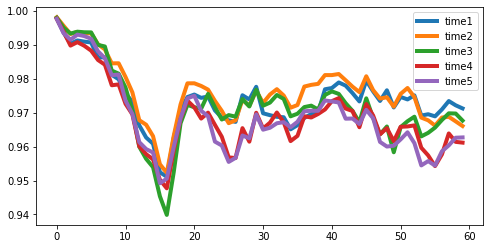

In [101]:
start = 140
#end = 155
end = 200

fig= plt.figure(figsize=(8,4))
plt.plot(time1_diff_matrix[start:end,start:end].diagonal(), label = "time1",linewidth=4.0)
plt.plot(time2_diff_matrix[start:end,start:end].diagonal(), label = "time2",linewidth=4.0)
plt.plot(time3_diff_matrix[start:end,start:end].diagonal(), label = "time3",linewidth=4.0)
plt.plot(time4_diff_matrix[start:end,start:end].diagonal(), label = "time4",linewidth=4.0)
plt.plot(time5_diff_matrix[start:end,start:end].diagonal(), label = "time5",linewidth=4.0)

plt.legend()
plt.show()

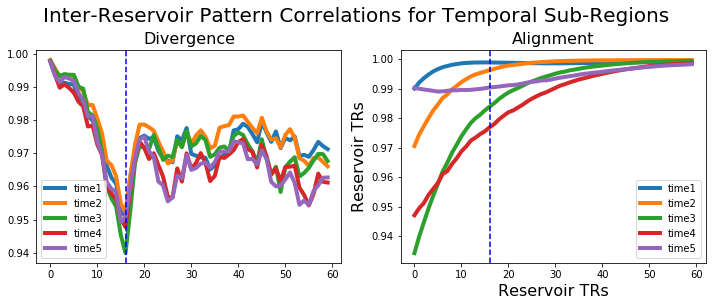

In [70]:
fig= plt.figure(figsize=(10,4))
fig.suptitle('Inter-Reservoir Pattern Correlations for Temporal Sub-Regions', y=1.05, fontsize=20)

#488
spot=16
plt.subplot(122)
start = 434
end = 494
plt.plot(time1_diff_matrix[start:end,start:end].diagonal(), label = "time1",linewidth=4.0)
plt.plot(time2_diff_matrix[start:end,start:end].diagonal(), label = "time2",linewidth=4.0)
plt.plot(time3_diff_matrix[start:end,start:end].diagonal(), label = "time3",linewidth=4.0)
plt.plot(time4_diff_matrix[start:end,start:end].diagonal(), label = "time4",linewidth=4.0)
plt.plot(time5_diff_matrix[start:end,start:end].diagonal(), label = "time5",linewidth=4.0)
plt.axvline(x=spot, color='b', linestyle='--')

plt.title('D. Immediate Divergence', fontsize=fs)
plt.xlabel('Reservoir TRs', fontsize=fs2)
plt.ylabel('Reservoir TRs', fontsize=fs2)

plt.legend()
plt.title('Alignment', fontsize=16)


plt.subplot(121)
start = 140
end = 200
plt.plot(time1_diff_matrix[start:end,start:end].diagonal(), label = "time1",linewidth=4.0)
plt.plot(time2_diff_matrix[start:end,start:end].diagonal(), label = "time2",linewidth=4.0)
plt.plot(time3_diff_matrix[start:end,start:end].diagonal(), label = "time3",linewidth=4.0)
plt.plot(time4_diff_matrix[start:end,start:end].diagonal(), label = "time4",linewidth=4.0)
plt.plot(time5_diff_matrix[start:end,start:end].diagonal(), label = "time5",linewidth=4.0)
plt.axvline(x=spot, color='b', linestyle='--')

plt.legend()
plt.title('Divergence', fontsize=16)
name = "%ireservoircontrast1.png" % i
plt.savefig(name, format='png')
fig.tight_layout()
plt.savefig('reservoir-not-the-fall-time-convergence-divergence.png', dpi=600, bbox_inches='tight')


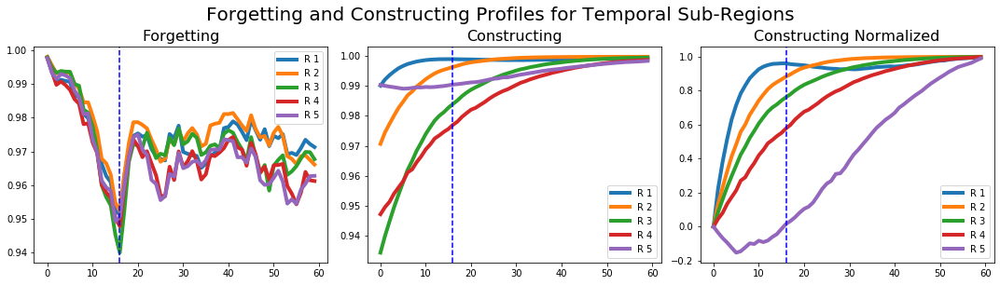

In [111]:
fig= plt.figure(figsize=(15,4))
fig.suptitle('Forgetting and Constructing Profiles for Temporal Sub-Regions', y=1.05, fontsize=20)

spot=16

plt.subplot(131)
start = 140
end = 200
plt.plot(time1_diff_matrix[start:end,start:end].diagonal(), label = "R 1",linewidth=4.0)
plt.plot(time2_diff_matrix[start:end,start:end].diagonal(), label = "R 2",linewidth=4.0)
plt.plot(time3_diff_matrix[start:end,start:end].diagonal(), label = "R 3",linewidth=4.0)
plt.plot(time4_diff_matrix[start:end,start:end].diagonal(), label = "R 4",linewidth=4.0)
plt.plot(time5_diff_matrix[start:end,start:end].diagonal(), label = "R 5",linewidth=4.0)
plt.axvline(x=spot, color='b', linestyle='--')

plt.legend()
plt.title('Forgetting', fontsize=16)





plt.subplot(132)
start = 434
end = 494
plt.plot(time1_diff_matrix[start:end,start:end].diagonal(), label = "R 1",linewidth=4.0)
plt.plot(time2_diff_matrix[start:end,start:end].diagonal(), label = "R 2",linewidth=4.0)
plt.plot(time3_diff_matrix[start:end,start:end].diagonal(), label = "R 3",linewidth=4.0)
plt.plot(time4_diff_matrix[start:end,start:end].diagonal(), label = "R 4",linewidth=4.0)
plt.plot(time5_diff_matrix[start:end,start:end].diagonal(), label = "R 5",linewidth=4.0)
plt.axvline(x=spot, color='b', linestyle='--')

#plt.title('D. Immediate Divergence', fontsize=fs)
#plt.xlabel('Reservoir TRs', fontsize=fs2)
#plt.ylabel('Reservoir TRs', fontsize=fs2)

plt.legend()
plt.title('Constructing', fontsize=16)




plt.subplot(133)

start = 434
end = 494

scale1=(time1_diff_matrix[end,end]/abs(time1_diff_matrix[start,start])-1)
scale2=(time2_diff_matrix[end,end]/abs(time2_diff_matrix[start,start])-1)
scale3=(time3_diff_matrix[end,end]/abs(time3_diff_matrix[start,start])-1)
scale4=(time4_diff_matrix[end,end]/abs(time4_diff_matrix[start,start])-1)
scale5=(time5_diff_matrix[end,end]/abs(time5_diff_matrix[start,start])-1)


plt.plot((time1_diff_matrix[start:end,start:end].diagonal()/abs(time1_diff_matrix[start,start])-1)/scale1, label = "R 1",linewidth=4.0)
plt.plot((time2_diff_matrix[start:end,start:end].diagonal()/abs(time2_diff_matrix[start,start])-1)/scale2, label = "R 2",linewidth=4.0)
plt.plot((time3_diff_matrix[start:end,start:end].diagonal()/abs(time3_diff_matrix[start,start])-1)/scale3, label = "R 3",linewidth=4.0)
plt.plot((time4_diff_matrix[start:end,start:end].diagonal()/abs(time4_diff_matrix[start,start])-1)/scale4, label = "R 4",linewidth=4.0)
plt.plot((time5_diff_matrix[start:end,start:end].diagonal()/abs(time5_diff_matrix[start,start])-1)/scale5, label = "R 5",linewidth=4.0)
plt.axvline(x=spot, color='b', linestyle='--')

plt.legend()
plt.title('Constructing Normalized', fontsize=16)

fig.tight_layout()
plt.savefig('reservoir-not-the-fall-time-convergence-divergence-timeconstants.png', dpi=600, bbox_inches='tight')


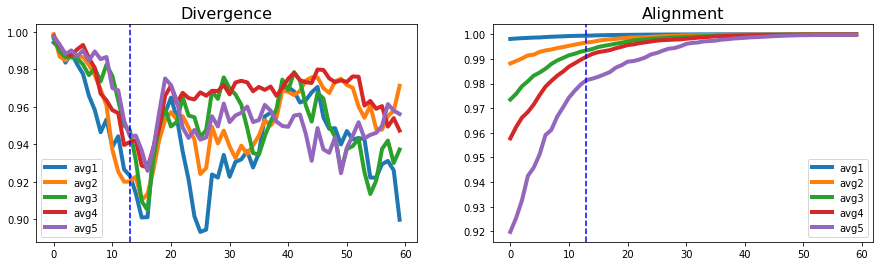

In [71]:
fig= plt.figure(figsize=(15,4))
#488
plt.subplot(122)
start = 434
end = 494
plt.plot(avg1_diff_matrix[start:end,start:end].diagonal(), label = "avg1",linewidth=4.0)
plt.plot(avg2_diff_matrix[start:end,start:end].diagonal(), label = "avg2",linewidth=4.0)
plt.plot(avg3_diff_matrix[start:end,start:end].diagonal(), label = "avg3",linewidth=4.0)
plt.plot(avg4_diff_matrix[start:end,start:end].diagonal(), label = "avg4",linewidth=4.0)
plt.plot(avg5_diff_matrix[start:end,start:end].diagonal(), label = "avg5",linewidth=4.0)
plt.axvline(x=13, color='b', linestyle='--')

plt.legend()
plt.title('Alignment', fontsize=16)


plt.subplot(121)
start = 140
end = 200
plt.plot(avg1_diff_matrix[start:end,start:end].diagonal(), label = "avg1",linewidth=4.0)
plt.plot(avg2_diff_matrix[start:end,start:end].diagonal()**0.5, label = "avg2",linewidth=4.0)
plt.plot(avg3_diff_matrix[start:end,start:end].diagonal(), label = "avg3",linewidth=4.0)
plt.plot(avg4_diff_matrix[start:end,start:end].diagonal(), label = "avg4",linewidth=4.0)
plt.plot(avg5_diff_matrix[start:end,start:end].diagonal(), label = "avg5",linewidth=4.0)
plt.axvline(x=13, color='b', linestyle='--')

plt.legend()
plt.title('Divergence', fontsize=16)
name = "%iavg1.png" % i
plt.savefig(name, format='png')
#plt.savefig('reservoir-not-the-fall-avg-convergence-divergence.png', dpi=600)


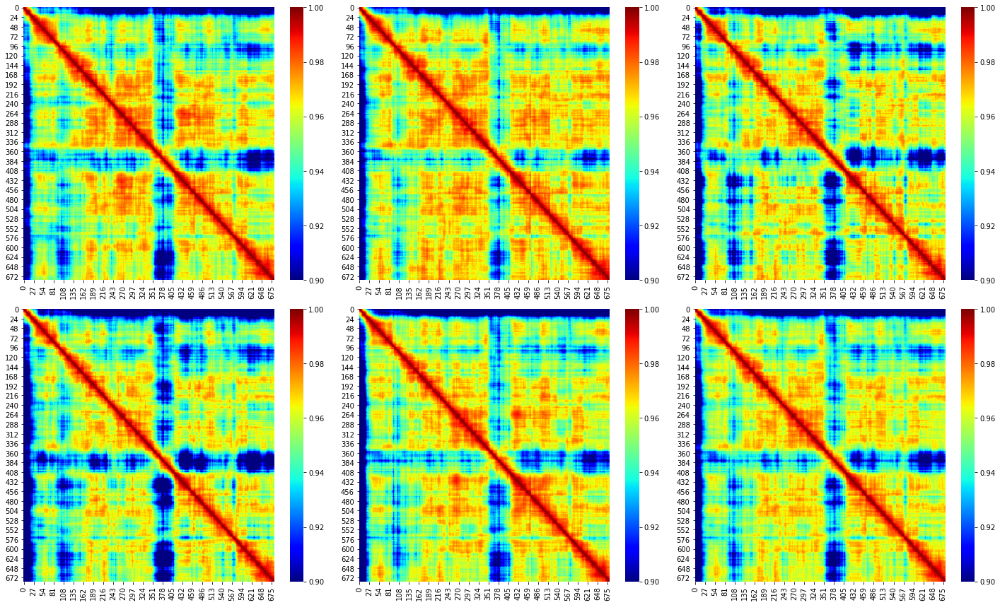

In [72]:
scale = 0.9

fig= plt.figure(figsize=(20,12))
plt.subplot(231)
sns.heatmap(time1_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(232)
sns.heatmap(time2_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(233)
sns.heatmap(time3_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(234)
sns.heatmap(time4_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(235)
sns.heatmap(time5_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(236)
sns.heatmap(time_control_matrix,  cmap='jet', vmin=scale, vmax=1)

fig.tight_layout()

plt.savefig('reservoir-not-the-fall-time-tree-structure-jet3.png', dpi=600)

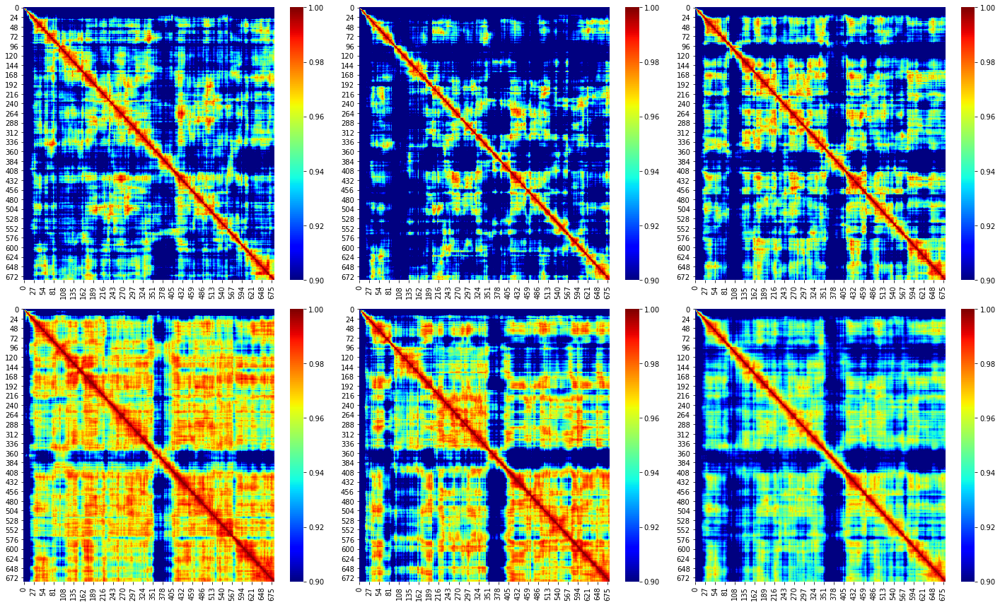

In [73]:
scale = 0.9

fig= plt.figure(figsize=(20,12))
plt.subplot(231)
sns.heatmap(avg1_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(232)
sns.heatmap(avg2_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(233)
sns.heatmap(avg3_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(234)
sns.heatmap(avg4_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(235)
sns.heatmap(avg5_matrix,  cmap='jet', vmin=scale, vmax=1)

plt.subplot(236)
sns.heatmap(avg_control_matrix,  cmap='jet', vmin=scale, vmax=1)

fig.tight_layout()

plt.savefig('avg-not-the-fall-avg-tree-structure-jet3.png', dpi=600)

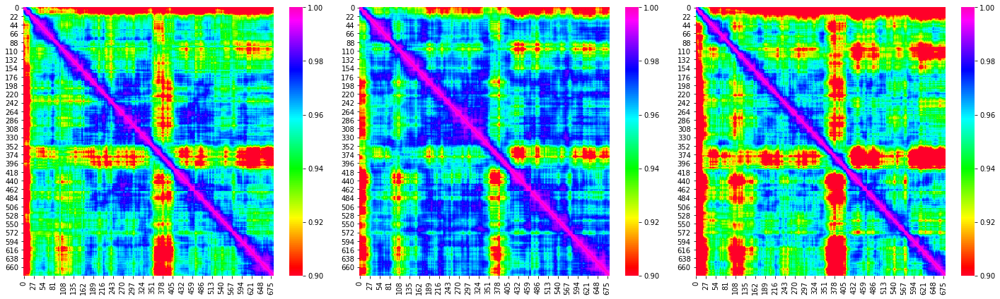

In [74]:
scale = 0.9
#color = 'jet'
color = 'gist_rainbow'

fig= plt.figure(figsize=(20,6))
plt.subplot(131)
sns.heatmap(time1bis_matrix,  cmap=color, vmin=scale, vmax=1)

plt.subplot(132)
sns.heatmap(time2bis_matrix,  cmap=color, vmin=scale, vmax=1)

plt.subplot(133)
sns.heatmap(time3bis_matrix,  cmap=color, vmin=scale, vmax=1)

fig.tight_layout()

#plt.savefig('reservoir-not-the-fall-time-tree-structure-3-gist-rainbow3.png', dpi=600)

In [75]:
sim_matrix1 == time_control_matrix

array([[False, False, False, ..., False,  True, False],
       [False, False,  True, ..., False, False, False],
       [False,  True, False, ..., False, False,  True],
       ...,
       [False, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       [False, False,  True, ..., False, False, False]])

In [76]:
difference = sim_matrix1 - time_control_matrix


In [77]:
print(difference)

[[-4.44089210e-16  3.33066907e-16  1.11022302e-16 ...  2.22044605e-16
   0.00000000e+00 -2.22044605e-16]
 [ 3.33066907e-16 -2.22044605e-16  0.00000000e+00 ...  1.11022302e-16
  -1.11022302e-16  3.33066907e-16]
 [ 1.11022302e-16  0.00000000e+00 -3.33066907e-16 ...  1.11022302e-16
  -3.33066907e-16  0.00000000e+00]
 ...
 [ 2.22044605e-16  1.11022302e-16  1.11022302e-16 ... -3.33066907e-16
   1.11022302e-16  1.11022302e-16]
 [ 0.00000000e+00 -1.11022302e-16 -3.33066907e-16 ...  1.11022302e-16
  -2.22044605e-16  2.22044605e-16]
 [-2.22044605e-16  3.33066907e-16  0.00000000e+00 ...  1.11022302e-16
   2.22044605e-16 -4.44089210e-16]]


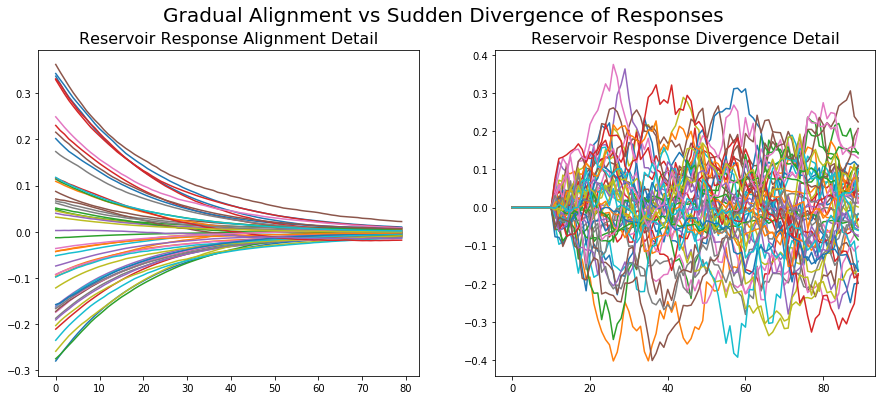

In [78]:
#inflection points at 139 433 - dispmay 10 before and 40 after
resbegin = 450
resend = 500

fig= plt.figure(figsize=(15,6))

plt.subplot(121)
begin=433
end=513
plt.plot( SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])
plt.title('Reservoir Response Alignment Detail', fontsize=16)



plt.subplot(122)
begin=129
end=219

plt.plot( SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])
plt.title('Reservoir Response Divergence Detail', fontsize=16)



fig.suptitle('Gradual Alignment vs Sudden Divergence of Responses', fontsize=20)

#fig.tight_layout()

plt.savefig('reservoirstates-not-the-fall-temporal-context-combned-fractions3.png',dpi=600)

In [79]:
print(SortedStates.shape)

(1000, 683)


In [80]:
print(reservoirStatesBuffer1.shape)

(682, 1000)


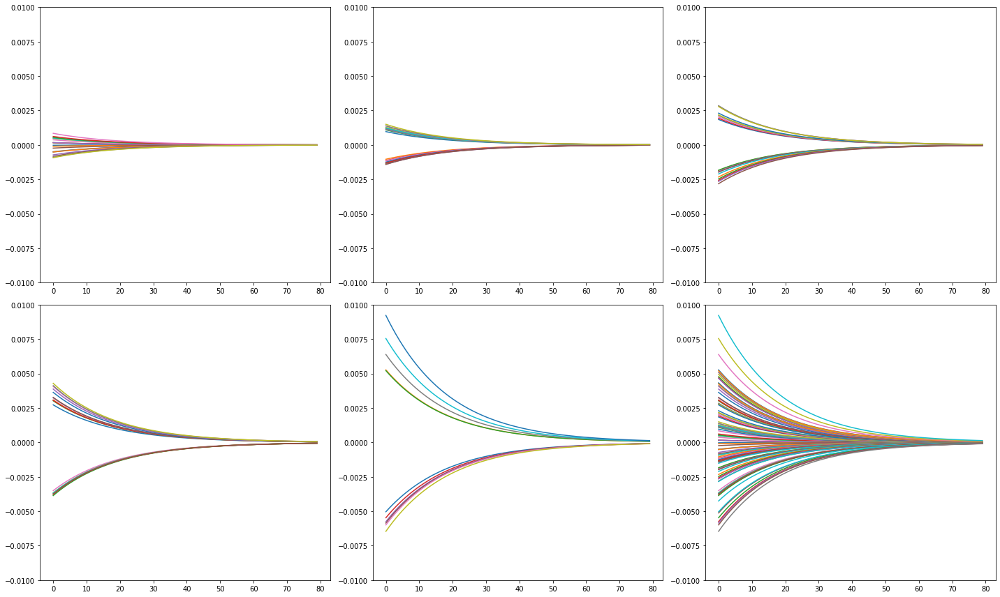

In [81]:
scale = 0.9
begin=433
end=513
#        time1_matrix[i,j] = cos_sim(SortedAvgT[i,0:165],SortedAvgT[j,0:165])
#        time2_matrix[i,j] = cos_sim(SortedAvgT[i,166:248],SortedAvgT[j,166:248])
#        time3_matrix[i,j] = cos_sim(SortedAvgT[i,249:332],SortedAvgT[j,249:332])
#        time4_matrix[i,j] = cos_sim(SortedAvgT[i,333:415],SortedAvgT[j,333:415])
#        time5_matrix[i,j] = cos_sim(SortedAvgT[i,416:500],SortedAvgT[j,416:500])



fig= plt.figure(figsize=(20,12))

plt.subplot(231)
plt.ylim([-0.01, 0.01])
resbegin = 0
resend = 19
plt.plot(SortedAvg1T[begin:end,resbegin:resend] - SortedAvg2T[begin:end,resbegin:resend])

plt.subplot(232)
plt.ylim([-0.01, 0.01])
resbegin = 20
resend = 39
plt.plot(SortedAvg1T[begin:end,resbegin:resend] - SortedAvg2T[begin:end,resbegin:resend])

plt.subplot(233)
plt.ylim([-0.01, 0.01])
resbegin = 40
resend = 59
plt.plot(SortedAvg1T[begin:end,resbegin:resend] - SortedAvg2T[begin:end,resbegin:resend])

plt.subplot(234)
plt.ylim([-0.01, 0.01])
resbegin = 60
resend = 79
plt.plot(SortedAvg1T[begin:end,resbegin:resend] - SortedAvg2T[begin:end,resbegin:resend])

plt.subplot(235)
plt.ylim([-0.01, 0.01])
resbegin = 89 #416
resend =100
plt.plot(SortedAvg1T[begin:end,resbegin:resend] - SortedAvg2T[begin:end,resbegin:resend])

plt.subplot(236)
plt.ylim([-0.01, 0.01])
resbegin = 0
resend =500
plt.plot(SortedAvg1T[begin:end,resbegin:resend] - SortedAvg2T[begin:end,resbegin:resend])

fig.tight_layout()

plt.savefig('avg-not-the-fall-SORTED-BUTTERFLY3.png', dpi=600)

([array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 80.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]),
  array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 80.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]),
  array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 80.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]),
  array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 80.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]),
  array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 80.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]),
  array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  5., 75.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]),
  array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 80.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]),
  array([ 0.,  0.,  0.,  0.,  0.,  0.,  0., 19., 61.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]),
  array([ 0.,  0.,  0.,  0.,  0.,  0.,  

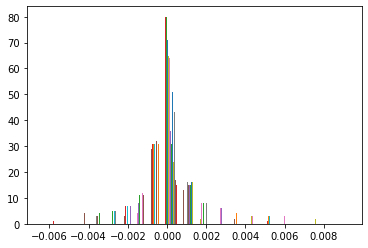

In [82]:
plt.hist(SortedAvg1T[begin:end,resbegin:resend] - SortedAvg2T[begin:end,resbegin:resend], bins=20) 

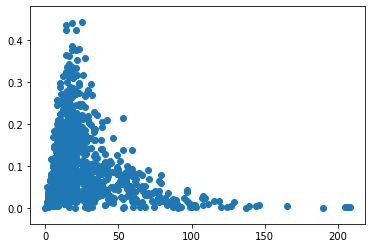

In [83]:
plt.scatter(save_timeconstants,res_maxes)

plt.show()

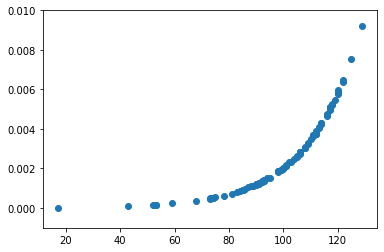

In [84]:
plt.scatter(save_timeconstants_avg,avg_maxes)
plt.ylim([-0.001, 0.01])
#plt.yscale("l"og)
plt.show()

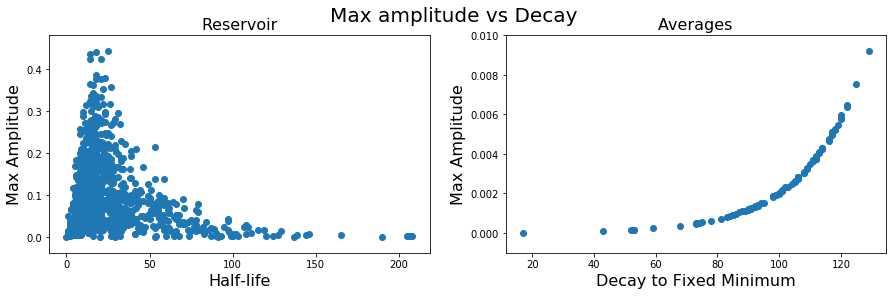

In [85]:
fig= plt.figure(figsize=(15,4))



fig.suptitle('Max amplitude vs Decay', fontsize=20)


plt.subplot(121)
plt.scatter(save_timeconstants,res_maxes)
plt.ylabel('Max Amplitude', fontsize=16)
plt.xlabel('Half-life', fontsize=16)
plt.title('Reservoir', fontsize=16)

plt.subplot(122)
plt.scatter(save_timeconstants_avg,avg_maxes)
plt.ylabel('Max Amplitude', fontsize=16)
plt.xlabel('Decay to Fixed Minimum', fontsize=16)
plt.title('Averages', fontsize=16)
plt.ylim([-0.001, 0.01])

#plt.show()
plt.savefig('reservoir-vs-averages-timing.png', dpi=600)

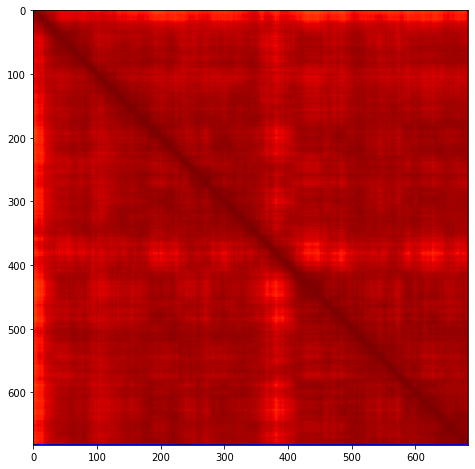

In [86]:
resbegin = 600
resend = 700

f, ax = plt.subplots(1,1, figsize = (10,8))
ax.imshow(np.corrcoef(SortedStatesT[:,resbegin:resend]), cmap='jet')

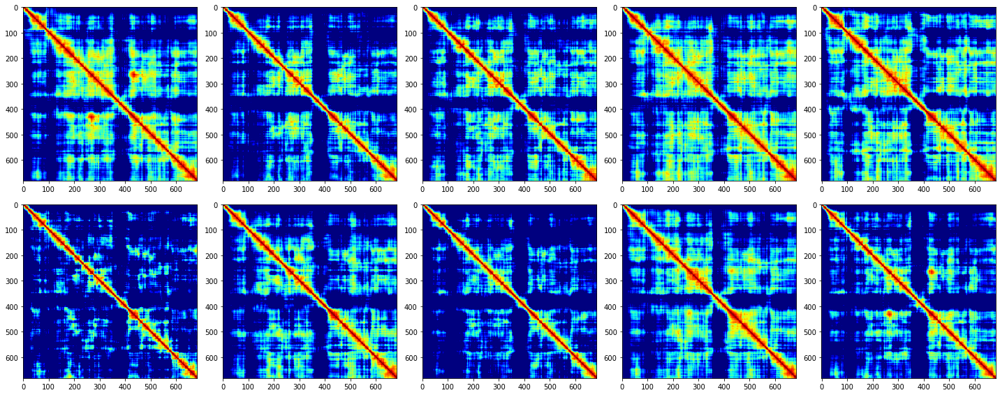

In [87]:
scale = 0.95
begin=433
end=513

begin=0
end=700

color = 'viridis'
color = 'jet'

fig=plt.figure(figsize=(20, 8))


fig.add_subplot(2, 5, 1)
resbegin = 0
resend = 99
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.add_subplot(252)
resbegin = 100
resend = 199
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.add_subplot(253)
resbegin = 200
resend = 299
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.add_subplot(254)
resbegin = 300
resend = 399
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.add_subplot(255)
resbegin = 400 #416
resend =499
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.add_subplot(256)
resbegin = 550
resend = 599
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.add_subplot(257)
resbegin = 600
resend = 699
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.add_subplot(258)
resbegin = 700
resend = 799
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.add_subplot(259)
resbegin = 800
resend = 899
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.add_subplot(2,5,10)
resbegin = 900 #416
resend =1000
plt.imshow(np.corrcoef(SortedStatesT[begin:end,resbegin:resend]), cmap=color, vmin=scale, vmax=1)

fig.tight_layout()

plt.savefig('1000-10-SORTED-heatmaps.png', dpi=600)
plt.show()

In [88]:
print(np.corrcoef(SortedStatesT[start:end,resbegin:resend]-SortedStates2T[start:end,resbegin:resend]).diagonal())

[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1

C:\Users\PeterDell\anaconda3\lib\site-packages\numpy\lib\function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\PeterDell\anaconda3\lib\site-packages\numpy\lib\function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [89]:
print(start, end)

140 700


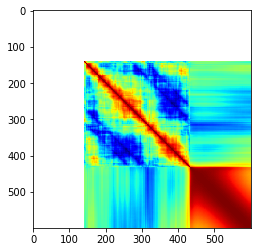

In [90]:
start = 0
end = 600
plt.imshow(np.corrcoef(SortedStatesT[start:end,resbegin:resend]-SortedStates2T[start:end,resbegin:resend]),cmap='jet')

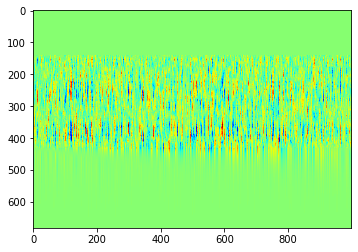

In [91]:
plt.imshow(SortedStatesT-SortedStates2T,cmap='jet')

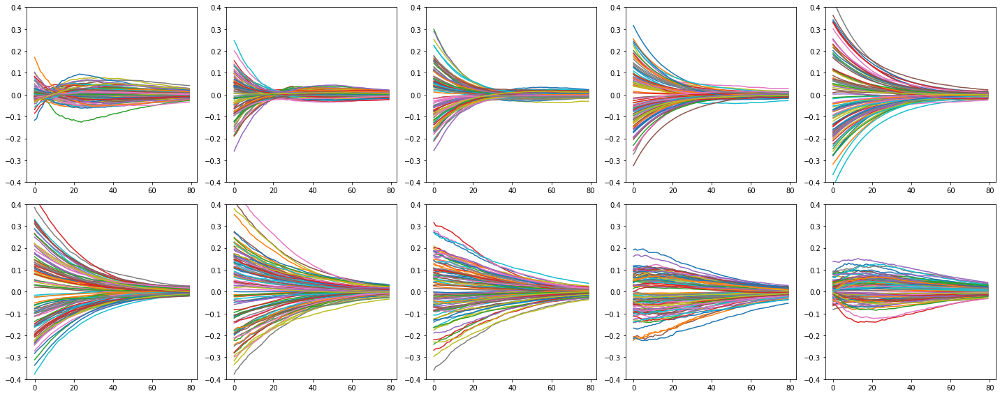

In [92]:
scale = 0.9
begin=433
end=513
#        time1_matrix[i,j] = cos_sim(SortedStatesT[i,0:165],SortedStatesT[j,0:165])
#        time2_matrix[i,j] = cos_sim(SortedStatesT[i,166:248],SortedStatesT[j,166:248])
#        time3_matrix[i,j] = cos_sim(SortedStatesT[i,249:332],SortedStatesT[j,249:332])
#        time4_matrix[i,j] = cos_sim(SortedStatesT[i,333:415],SortedStatesT[j,333:415])
#        time5_matrix[i,j] = cos_sim(SortedStatesT[i,416:500],SortedStatesT[j,416:500])


fig= plt.figure(figsize=(20,8))

plt.subplot(251)
plt.ylim([-0.4, 0.4])
resbegin = 0
resend = 99
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(252)
plt.ylim([-0.4, 0.4])
resbegin = 100
resend = 199
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(253)
plt.ylim([-0.4, 0.4])
resbegin = 200
resend = 299
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(254)
plt.ylim([-0.4, 0.4])
resbegin = 300
resend = 399
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(255)
plt.ylim([-0.4, 0.4])
resbegin = 400 #416
resend =499
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(256)
plt.ylim([-0.4, 0.4])
resbegin = 500
resend = 599
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(257)
plt.ylim([-0.4, 0.4])
resbegin = 600
resend = 699
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(258)
plt.ylim([-0.4, 0.4])
resbegin = 700
resend = 799
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(259)
plt.ylim([-0.4, 0.4])
resbegin = 800
resend = 899
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(2,5,10)
plt.ylim([-0.4, 0.4])
resbegin = 900 #416
resend =1000
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])


fig.tight_layout()

plt.savefig('1000-10-SORTED-BUTTERFLY3.png', dpi=600)

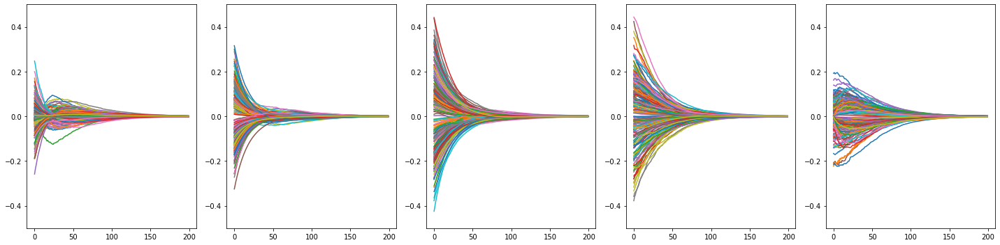

In [100]:
scale = 0.9
begin=433
end=633
#        time1_matrix[i,j] = cos_sim(SortedStatesT[i,0:165],SortedStatesT[j,0:165])
#        time2_matrix[i,j] = cos_sim(SortedStatesT[i,166:248],SortedStatesT[j,166:248])
#        time3_matrix[i,j] = cos_sim(SortedStatesT[i,249:332],SortedStatesT[j,249:332])
#        time4_matrix[i,j] = cos_sim(SortedStatesT[i,333:415],SortedStatesT[j,333:415])
#        time5_matrix[i,j] = cos_sim(SortedStatesT[i,416:500],SortedStatesT[j,416:500])


fig= plt.figure(figsize=(20,5))

plt.subplot(151)
plt.ylim([-0.5, 0.5])
resbegin = 0
resend = 199
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(152)
plt.ylim([-0.5, 0.5])
resbegin =200
resend = 399
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(153)
plt.ylim([-0.5, 0.5])
resbegin = 400
resend = 599
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(154)
plt.ylim([-0.5, 0.5])
resbegin = 600
resend = 799
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

plt.subplot(155)
plt.ylim([-0.5, 0.5])
resbegin = 800 #416
resend =999
plt.plot(SortedStatesT[begin:end,resbegin:resend] - SortedStates2T[begin:end,resbegin:resend])

fig.tight_layout()

plt.savefig('1000-5-SORTED-BUTTERFLY3.png', dpi=600)

C:\Users\PeterDell\anaconda3\lib\site-packages\numpy\lib\function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\PeterDell\anaconda3\lib\site-packages\numpy\lib\function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


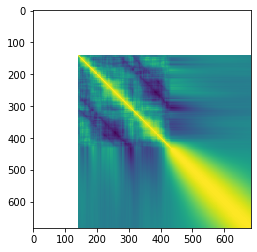

In [94]:
plt.imshow(np.corrcoef(SortedStatesT-SortedStates2T))

In [95]:
np.save('NTF-SortedStates10.npy', SortedStatesT) 


In [96]:
SortedAvg1T

array([[-3.14899057e-01, -2.28573959e-02, -1.66223243e-01, ...,
        -2.50632465e-01,  1.62005033e-02, -2.46270850e-01],
       [-1.17755236e-01,  6.63314085e-03, -1.08673628e-01, ...,
        -2.96258937e-01,  1.27424294e-01, -2.14398328e-01],
       [ 2.40478045e-02, -7.96849741e-02, -1.86924200e-01, ...,
        -3.38062654e-01, -6.32682816e-02, -3.88208066e-01],
       ...,
       [-8.80535128e-04,  6.16232583e-03, -1.04223897e-03, ...,
        -8.92365478e-03,  2.16872275e-03,  2.98877453e-03],
       [-1.34828368e-03,  5.93498332e-03, -1.32312697e-03, ...,
        -8.68347307e-03,  2.75368173e-03,  3.41849399e-03],
       [ 1.70000000e+01,  4.30000000e+01,  5.20000000e+01, ...,
         1.22000000e+02,  1.25000000e+02,  1.29000000e+02]])

In [97]:
np.save('NTF-SortedAverages10.npy', SortedAvg1T)